In [2]:
#2021Feb17 Josi
#
#Merge HumanMouse MOL Ctrl SCTcorrected samples 
#noMathys
#SCT UMAP
#scRNA-seq
#Analysis

In [2]:
#for scRNA-seq objects
library(Seurat)
library(dplyr)

#for visualization
library(cowplot)
library(ggplot2)
library(patchwork)
#for DGE analysis
library(DESeq2)
library(MAST)



#color
library(RColorBrewer)

#3D plotting

library(plotly)


Attaching package: ‘dplyr’

The following objects are masked from ‘package:stats’:

    filter, lag

The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


********************************************************
Note: As of version 1.0.0, cowplot does not change the
  default ggplot2 theme anymore. To recover the previous
  behavior, execute:
  theme_set(theme_cowplot())
********************************************************


Attaching package: ‘patchwork’

The following object is masked from ‘package:cowplot’:

    align_plots

Loading required package: S4Vectors
Loading required package: stats4
Loading required package: BiocGenerics
Loading required package: parallel

Attaching package: ‘BiocGenerics’

The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB

The 

In [3]:
##Import Merged Dataset
HuMo<-readRDS("/media/reuschenbach/Data/Masterthesis/Merged/HumanMouseCtrl/DataHumanMouseMOL/2020_scRNA_MouseHuman_HealthyMOL_UMAP_SCT_Cluster_noMathys.rds")

In [3]:
#Checking Cell Number of every Study
table(HuMo$Study)


   Falcao2018Mouse        Grubman2019          Habib2017         Jaekel2019 
               612               2777               2936               3519 
          Lake2018   Marques2016Mouse  Saunders2018Mouse        Wheeler2019 
              4353               4031              49270              10534 
  Wheeler2020Mouse Ximerakis2019Mouse    Zeisel2015Mouse    Zeisel2018Mouse 
              1373              15400                820              20575 
          Zhou2020      Zhou2020Mouse 
             17398               3885 

In [3]:
#color panel
color<-c("tomato","peru","olivedrab3","springgreen4", "seagreen3","turquoise3","dodgerblue1","steelblue3","orchid","deeppink1","magenta")

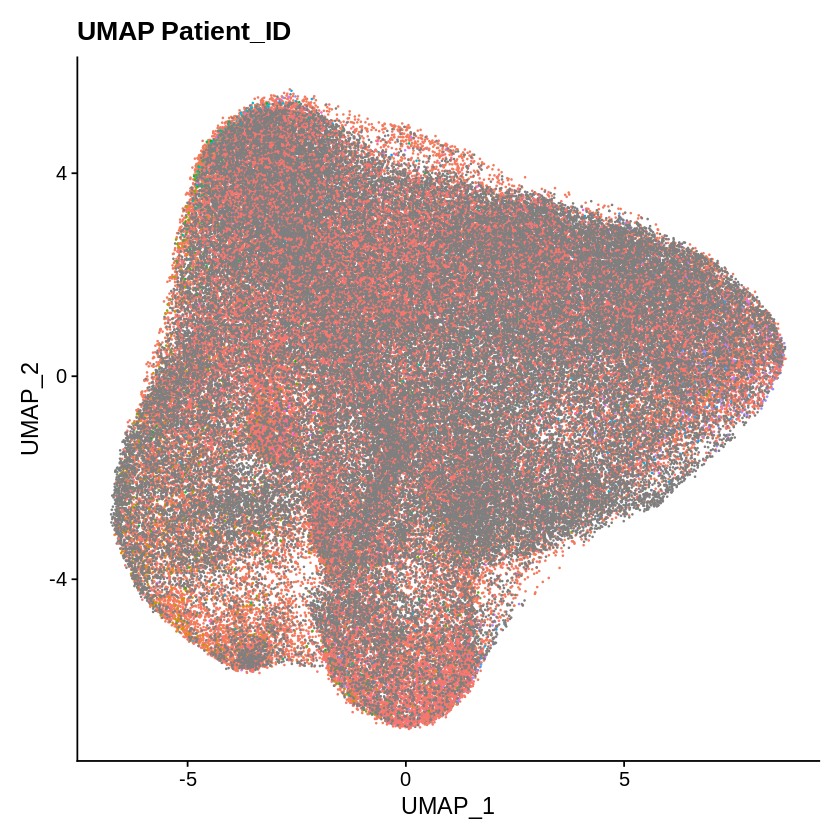

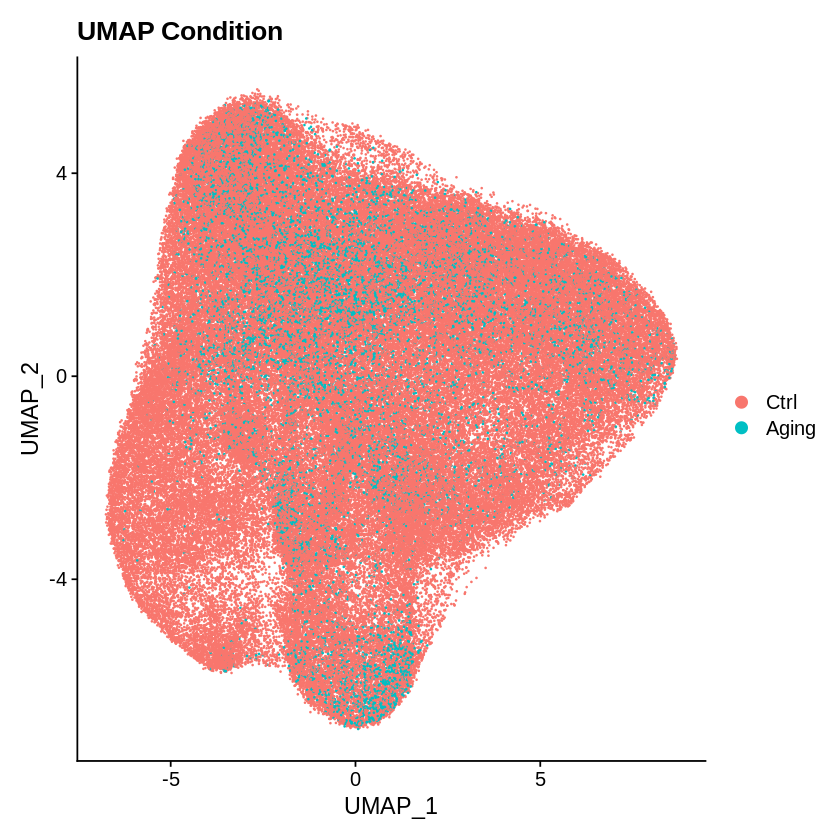

In [6]:
#checking for batch effect by visualizing different identities (e.g. studies,species, CellType, Tissue)
Idents(HuMo) <- "Study"
IntegrationStudy<-DimPlot(HuMo, reduction="umap", pt.size=0.1) +ggtitle(label = "UMAP Study")
Idents(HuMo)<-"Patient_ID"
DimPlot(HuMo, reduction="umap", pt.size=0.1)  + NoLegend() + ggtitle (label = "UMAP Patient_ID")
Idents(HuMo) <- "CellType"
IntegrationCellType<-DimPlot(HuMo, reduction="umap", pt.size=0.1) +ggtitle(label = "UMAP Celltype")
Idents(HuMo) <- "Species"
IntegrationSpecies<-DimPlot(HuMo, reduction="umap", pt.size=0.1) +ggtitle(label = "UMAP Species")
Idents(HuMo) <- "Tissue"
IntegrationTissue<-DimPlot(HuMo, reduction="umap", pt.size=0.1) +ggtitle(label = "UMAP Tissue")
Idents(HuMo) <- "Sex"
IntegrationSex<-DimPlot(HuMo, reduction="umap", pt.size=0.1) +ggtitle(label = "UMAP Sex")
Idents(HuMo) <- "Age"
IntegrationAge<-DimPlot(HuMo, reduction="umap", pt.size=0.1) +ggtitle(label = "UMAP Age")
Idents(HuMo) <- "Platform"
IntegrationPlatform<-DimPlot(HuMo, reduction="umap", pt.size=0.1) +ggtitle(label = "UMAP Platform")
Idents(HuMo) <- "Condition"
DimPlot(HuMo, reduction="umap", pt.size=0.1) +ggtitle(label = "UMAP Condition")

In [9]:
#color background (transparent)
t.col <- rgb(235, 184, 42,
             max = 255,
             alpha = (100 - 100) * 255 / 100)

[1] "Human" "Mouse"

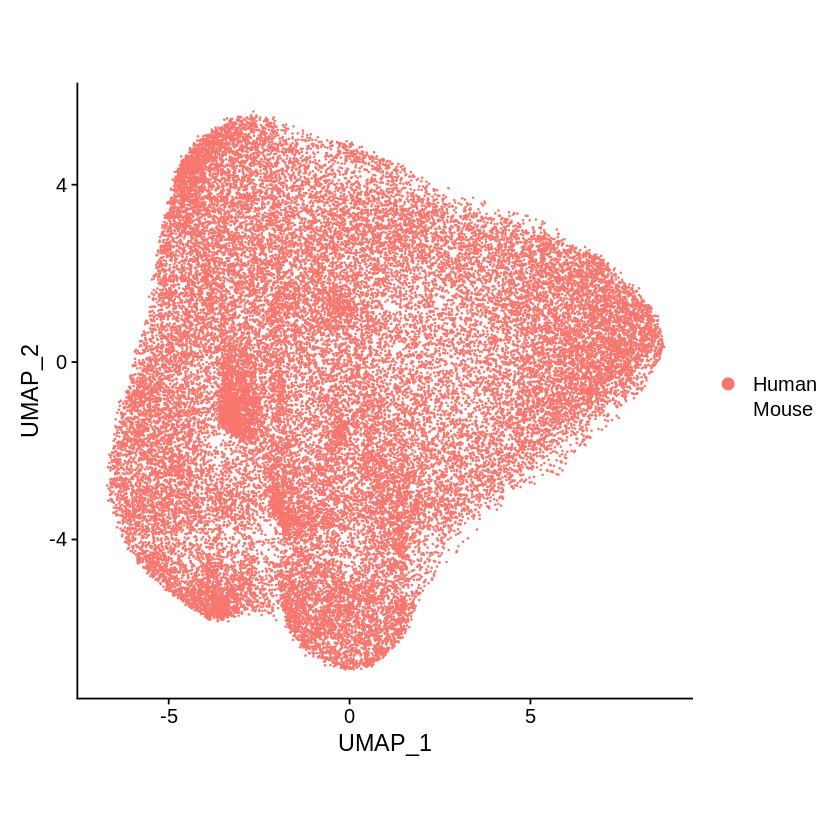

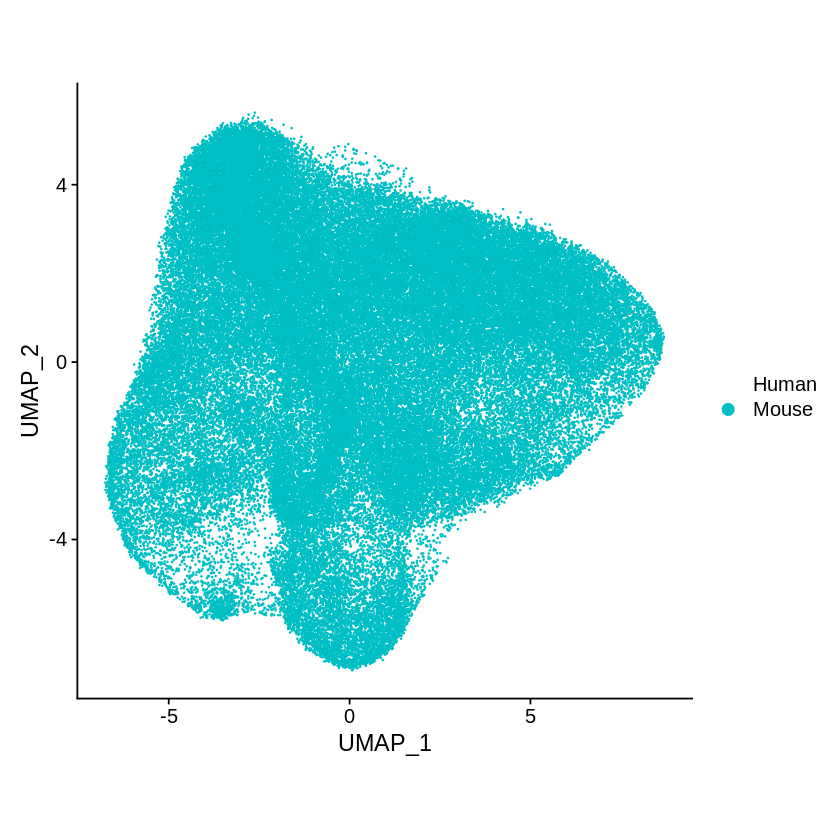

In [39]:
#check distribution of cells of different species in seperate plots
color<-scales::hue_pal()(2)
Idents(HuMo)<-"Species"
Species<- unique(HuMo@meta.data$Species)
Species
for(i in 1:length(Species)){
#    postscript(paste('/media/reuschenbach/Data/Masterthesis/Merged/HumanMouseCtrl/HumanMouseMOLnoMatPLOT/HumanMouseCtrl_Cluster',i,'.eps'))
  print(
    DimPlot(object=HuMo, pt.size =0.1, reduction="umap", label=F,
           cols=c(rep(t.col, i-1),
                  color[i],
                  rep(t.col, length(Species)-i))
           )+theme(aspect.ratio=1)
    )
  #  dev.off()
}

In [32]:
#number of human and mouse cells
table(HuMo$Species)


Human Mouse 
41517 95966 

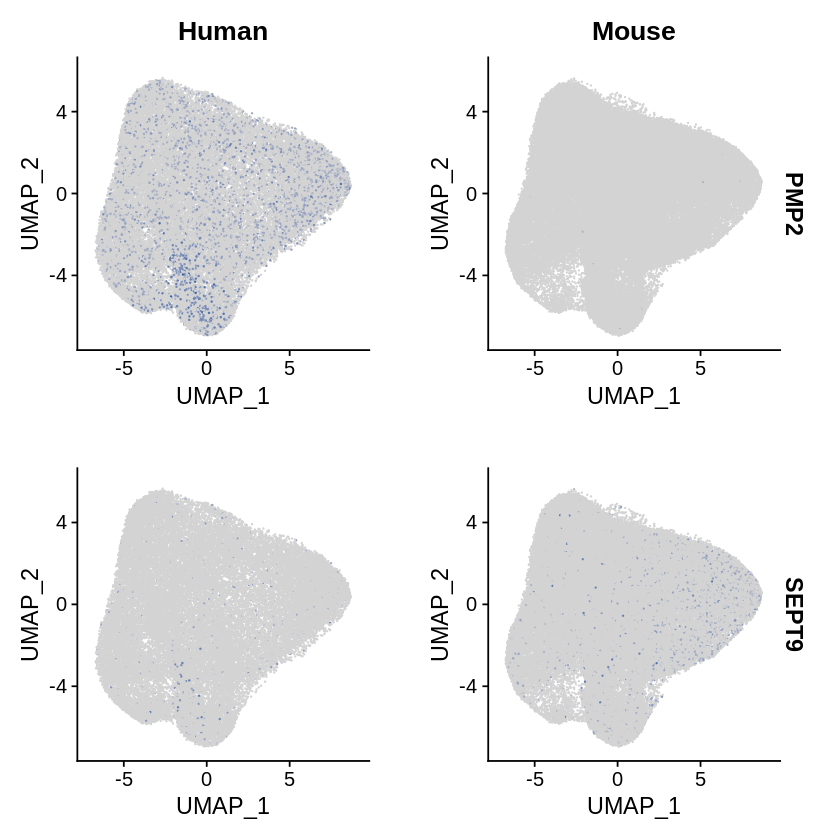

In [22]:
# UMAP plot highlithing the expression of markers seperated by species in two plots
DefaultAssay(HuMo)<-'RNA'
Spec1H<-FeaturePlot(HuMo, features = c("S100B", "APOD" ), split.by = "Species",cols=c('lightgrey', "#2962A7"))
Spec1M<-FeaturePlot(HuMo, features = c("S100B", "APOD" ), split.by = "Species",cols=c('lightgrey', "#C45E34"))

Spec2H<-FeaturePlot(HuMo, features = c( "GJC3", "TSPAN2"),  split.by = "Species",cols=c('lightgrey', "#2962A7"))
Spec2M<-FeaturePlot(HuMo, features = c( "GJC3", "TSPAN2"),  split.by = "Species",cols=c('lightgrey', "#C45E34"))

Spec3H<-FeaturePlot(HuMo, features = c( "PMP2", "SEPT9"),  split.by = "Species",cols=c('lightgrey', "#2962A7"))
Spec3M<-FeaturePlot(HuMo, features = c( "PMP2", "SEPT9"),  split.by = "Species",cols=c('lightgrey', "#C45E34"))

Spec3H


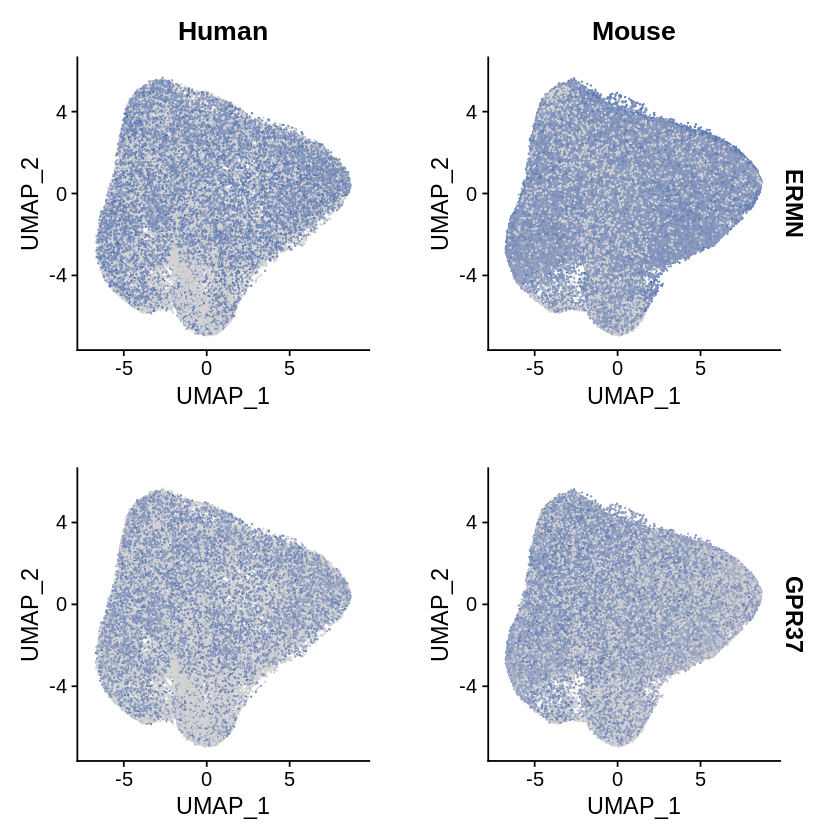

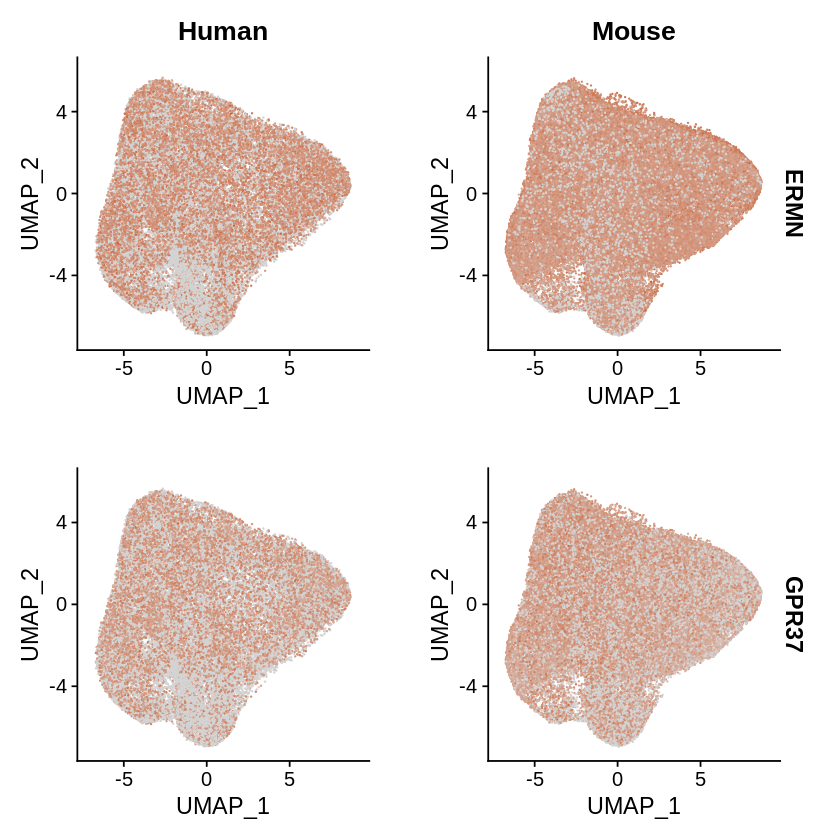

In [5]:
DefaultAssay(HuMo)<- 'RNA'
# UMAP plot highlithing the expression of MOL markers seperated by species in two plots
# Plottes twice respectively in orange and blue
MOL1H<-FeaturePlot(HuMo, features = c("CLDN11", "MAG"), split.by = "Species",cols=c('lightgrey', "#2962A7"))
MOL1M<-FeaturePlot(HuMo, features = c("CLDN11", "MAG"), split.by = "Species",cols=c('lightgrey', "#C45E34"))

MOL2H<-FeaturePlot(HuMo, features = c("SOX10", "PLP1"), split.by = "Species",cols=c('lightgrey', "#2962A7"))
MOL2M<-FeaturePlot(HuMo, features = c("SOX10", "PLP1"), split.by = "Species",cols=c('lightgrey', "#C45E34"))

MOL3H<-FeaturePlot(HuMo, features = c("MAL", "OPALIN"),  split.by = "Species",cols=c('lightgrey', "#2962A7"))
MOL3M<-FeaturePlot(HuMo, features = c("MAL", "OPALIN"),  split.by = "Species",cols=c('lightgrey', "#C45E34"))


MOL4H<-FeaturePlot(HuMo, features = c("MBP", "MOBP"), split.by = "Species",cols=c('lightgrey', "#2962A7"))
MOL4M<-FeaturePlot(HuMo, features = c("MBP", "MOBP"), split.by = "Species",cols=c('lightgrey', "#C45E34"))

MOL5H<-FeaturePlot(HuMo, features = c("MOG", "CA2"), split.by = "Species",cols=c('lightgrey', "#2962A7"))
MOL5M<-FeaturePlot(HuMo, features = c("MOG", "CA2"), split.by = "Species",cols=c('lightgrey', "#C45E34"))

MOL6H<-FeaturePlot(HuMo, features = c("ERMN", "GPR37"),  split.by = "Species",cols=c('lightgrey', "#2962A7"))
MOL6M<-FeaturePlot(HuMo, features = c("ERMN", "GPR37"),  split.by = "Species",cols=c('lightgrey', "#C45E34"))

MOL6H
MOL6M

In [220]:
DefaultAssay(HuMo)<-"RNA"
# UMAP plot highlithing the expression of OPC markers seperated by species in two plots
OPC1H<-FeaturePlot(HuMo, features = c( "PCDH15", "CCND1"),  split.by = "Species",cols=c('lightgrey', "#2962A7"))
OPC1M<-FeaturePlot(HuMo, features = c( "PCDH15", "CCND1"),  split.by = "Species",cols=c('lightgrey', "#C45E34"))

OPC2H<-FeaturePlot(HuMo, features = c("PDGFRA", "CSPG4" ), split.by = "Species",cols=c('lightgrey', "#2962A7"))
OPC2M<-FeaturePlot(HuMo, features = c("PDGFRA", "CSPG4" ), split.by = "Species",cols=c('lightgrey', "#C45E34"))

OPC3H<-FeaturePlot(HuMo, features = c( "PTPRZ1", "VCAN"),  split.by = "Species",cols=c('lightgrey', "#2962A7"))
OPC3M<-FeaturePlot(HuMo, features = c( "PTPRZ1", "VCAN"),  split.by = "Species",cols=c('lightgrey', "#C45E34"))


# UMAP plot highlithing the expression of NFO markers seperated by species in two plots
NFOL1H<-FeaturePlot(HuMo, features = c("NFASC", "FYN"),  split.by = "Species",cols=c('lightgrey', "#2962A7"))
NFOL1M<-FeaturePlot(HuMo, features = c("NFASC", "FYN"),  split.by = "Species",cols=c('lightgrey', "#C45E34"))


NFOL2H<-FeaturePlot(HuMo, features = c("GPR17", "ENPP6" ),  split.by = "Species",cols=c('lightgrey', "#2962A7"))
NFOL2M<-FeaturePlot(HuMo, features = c("GPR17", "ENPP6" ),  split.by = "Species",cols=c('lightgrey', "#C45E34"))

NFOL3H<-FeaturePlot(HuMo, features = c("BCAS1", "BMP4"),  split.by = "Species",cols=c('lightgrey', "#2962A7"))
NFOL3M<-FeaturePlot(HuMo, features = c("BCAS1", "BMP4"),  split.by = "Species",cols=c('lightgrey', "#C45E34"))

In [221]:
DefaultAssay(HuMo)<-"RNA"
# UMAP plot highlithing the expression of MOL markers seperated by species in two plots

MOLH_1H<-FeaturePlot(HuMo, features = c( "CRYAB", "PADI2"),  split.by = "Species",cols=c('lightgrey', "#2962A7"))
MOLH_1M<-FeaturePlot(HuMo, features = c( "CRYAB", "PADI2"),  split.by = "Species",cols=c('lightgrey', "#C45E34"))

MOLH_2H<-FeaturePlot(HuMo, features = c("S100B", "SEPT9" ), split.by = "Species",cols=c('lightgrey', "#2962A7"))
MOLH_2M<-FeaturePlot(HuMo, features = c("S100B", "SEPT9" ), split.by = "Species",cols=c('lightgrey', "#C45E34"))

#MOL marker
MOLM_1H<-FeaturePlot(HuMo, features = c("ASPA", "CA2"),  split.by = "Species",cols=c('lightgrey', "#2962A7"))
MOLM_1M<-FeaturePlot(HuMo, features = c("ASPA", "CA2"),  split.by = "Species",cols=c('lightgrey', "#C45E34"))


MOLM_2H<-FeaturePlot(HuMo, features = c("CA14", "CD81" ),  split.by = "Species",cols=c('lightgrey', "#2962A7"))
MOLM_2M<-FeaturePlot(HuMo, features = c("CA14", "CD81" ),  split.by = "Species",cols=c('lightgrey', "#C45E34"))

MOLM_3H<-FeaturePlot(HuMo, features = c("CD82", "CMTM5"),  split.by = "Species",cols=c('lightgrey', "#2962A7"))
MOLM_3M<-FeaturePlot(HuMo, features = c("CD82", "CMTM5"),  split.by = "Species",cols=c('lightgrey', "#C45E34"))

MOLM_4H<-FeaturePlot(HuMo, features = c("CLDN11", "ERMN"),  split.by = "Species",cols=c('lightgrey', "#2962A7"))
MOLM_4M<-FeaturePlot(HuMo, features = c("CLDN11", "ERMN"),  split.by = "Species",cols=c('lightgrey', "#C45E34"))

MOLM_5H<-FeaturePlot(HuMo, features = c("GPR37", "GSTP1" ),  split.by = "Species",cols=c('lightgrey', "#2962A7"))
MOLM_5M<-FeaturePlot(HuMo, features = c("GPR37", "GSTP1" ),  split.by = "Species",cols=c('lightgrey', "#C45E34"))

MOLM_6H<-FeaturePlot(HuMo, features = c("LGI3", "MAG"),  split.by = "Species",cols=c('lightgrey', "#2962A7"))
MOLM_6M<-FeaturePlot(HuMo, features = c("LGI3", "MAG"),  split.by = "Species",cols=c('lightgrey', "#C45E34"))

MOLM_7H<-FeaturePlot(HuMo, features = c("OMG", "PSAT1"),  split.by = "Species",cols=c('lightgrey', "#2962A7"))
MOLM_7M<-FeaturePlot(HuMo, features = c("OMG", "PSAT1"),  split.by = "Species",cols=c('lightgrey', "#C45E34"))

In [22]:
DefaultAssay(HuMo)<-"RNA"
#MOL transcription factors
MOLT_1H<-FeaturePlot(HuMo, features = c( "MYRF", "OLIG2"),  split.by = "Species",cols=c('lightgrey', "#2962A7"))
MOLT_1M<-FeaturePlot(HuMo, features = c( "MYRF", "OLIG2"),  split.by = "Species",cols=c('lightgrey', "#C45E34"))

MOLT_2H<-FeaturePlot(HuMo, features = c("NKX6.2", "CD9" ), split.by = "Species",cols=c('lightgrey', "#2962A7"))
MOLT_2M<-FeaturePlot(HuMo, features = c("NKX6.2", "CD9" ), split.by = "Species",cols=c('lightgrey', "#C45E34"))

In [24]:
HuMo


An object of class Seurat 
142219 features across 137483 samples within 3 assays 
Active assay: RNA (103487 features, 0 variable features)
 2 other assays present: SCT, integrated
 2 dimensional reductions calculated: pca, umap

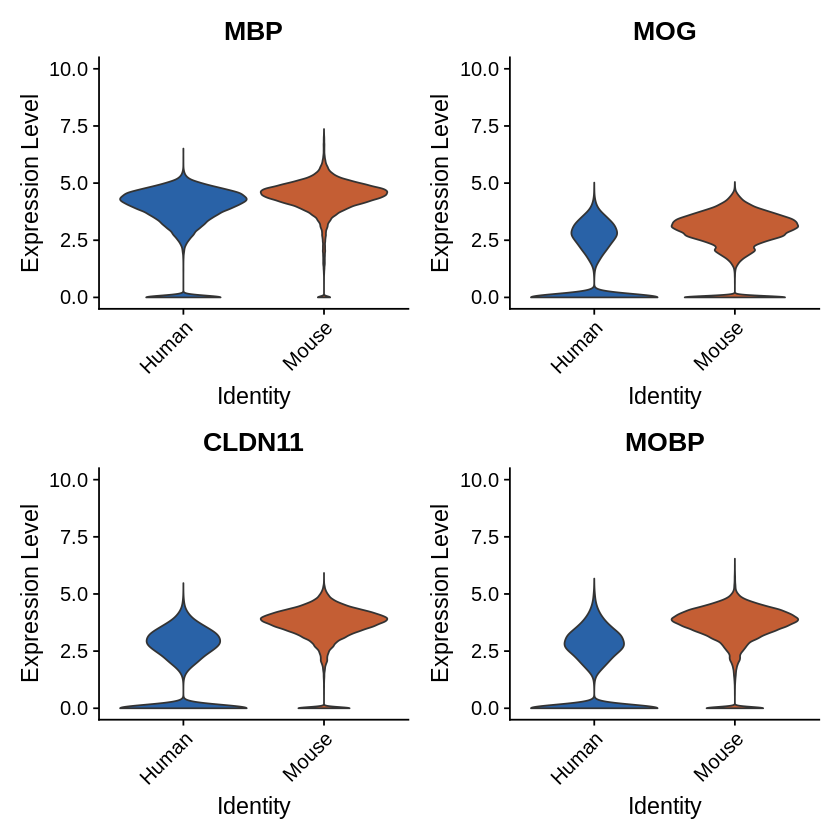

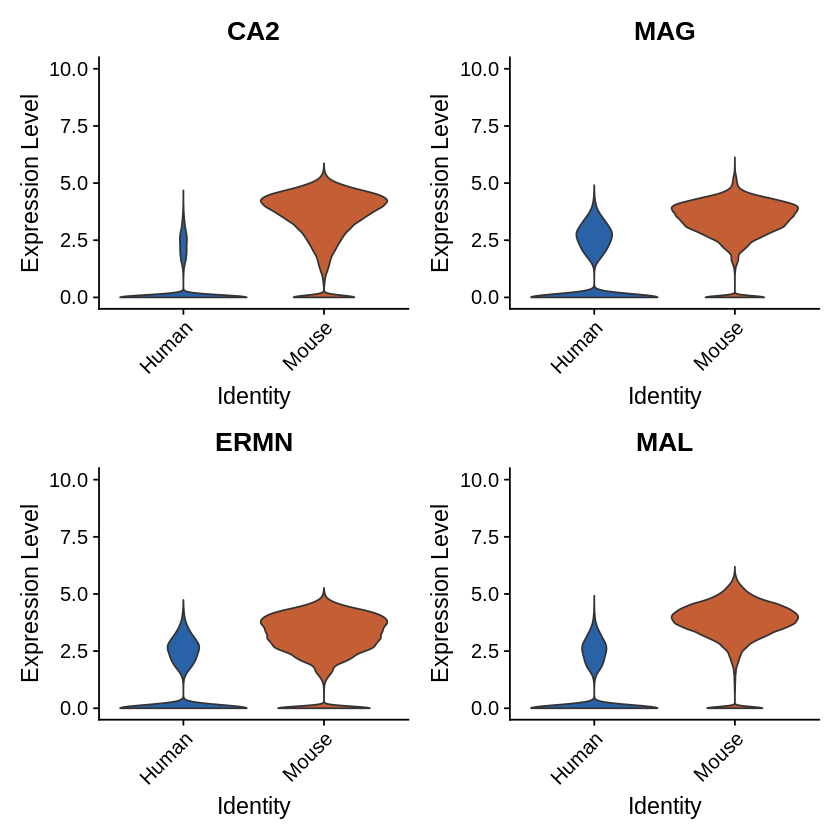

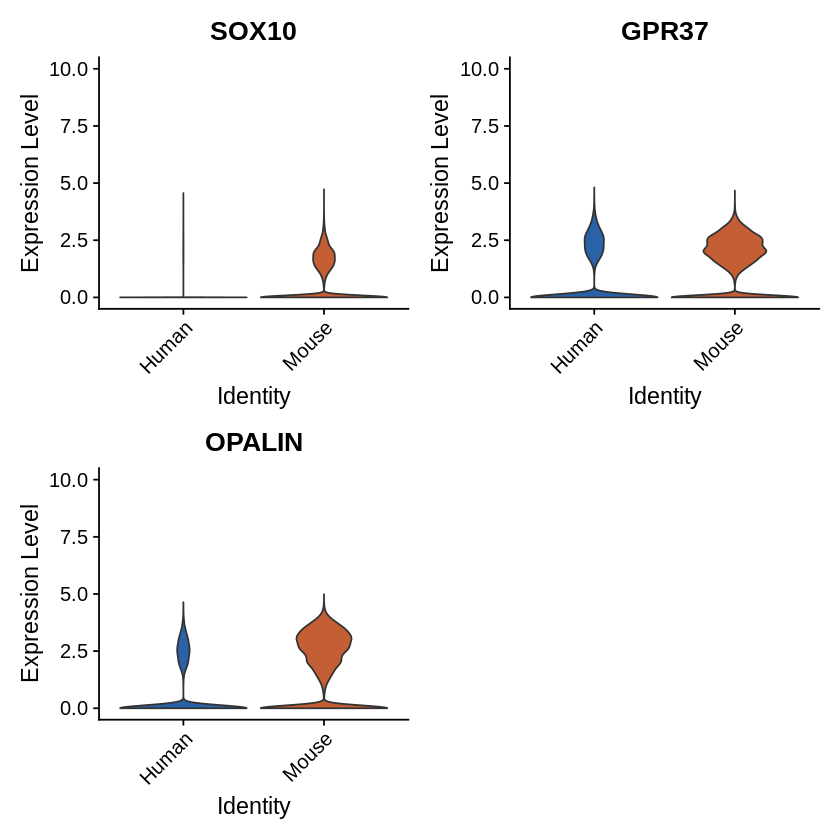

In [10]:
#Violin plots splitted by species revealing expression levels of marker genes 
#not showing single cells

DefaultAssay(HuMo)<-"RNA"
Idents(HuMo) <- "Species"
SpecColor <- c('#2962A7','#C45E34')
#Species specific
Vln_Species1<-VlnPlot(HuMo,c("MBP", "MOG",'CLDN11','MOBP' ),ncol=2, pt.size=0,y.max=10, cols=SpecColor)
Vln_Species2<-VlnPlot(HuMo,c('CA2','MAG', "ERMN", 'MAL'),ncol=2, pt.size=0,y.max=10, cols=SpecColor)
Vln_Species3<-VlnPlot(HuMo,c('SOX10','GPR37',"OPALIN"),ncol=2, pt.size=0,y.max=10, cols=SpecColor)

Vln_Species1
Vln_Species2
Vln_Species3


In [9]:
#Color panel used for Violin plots
Human.col <- rgb(41, 98, 167,
             max = 255,
             alpha = (100 - 90) * 255 / 100)
Mouse.col <- rgb(196, 94, 52,
             max = 255,
             alpha = (100 - 90) * 255 / 100)
trans<-rgb(196, 94, 52,
             max = 255,
             alpha = (100 - 100) * 255 / 100)

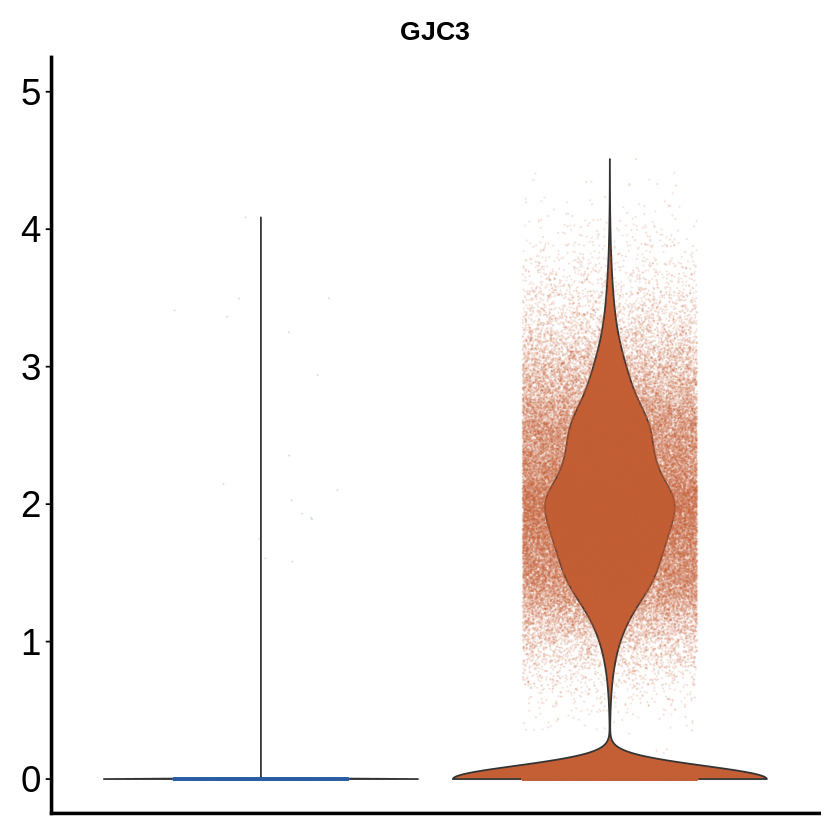

In [10]:
#Violin plots splitted by species revealing expression levels of marker genes 
#Showing single cells as transperent colored dots

DefaultAssay(HuMo)<-"RNA"
Idents(HuMo) <- "Species"

SpecColor <- c('#2962A7','#C45E34')
SpecColorDots <- c(Human.col, Mouse.col)
#Species specific

p <-  VlnPlot(HuMo, feature =c('GJC3'), split.by = 'Species',pt.size=0.0,y.max=5,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnOMG<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1),
         # panel.background = element_blank(), # bg of the panel
          # plot.background = element_blank()
            #panel.grid.major = element_blank(), # get rid of major grid
            #panel.grid.minor = element_blank(), # get rid of minor grid
            #legend.background = element_rect(fill = "transparent"), # get rid of legend bg
            #legend.box.background = element_rect(fill = "transparent") # get rid of legend panel bg
            )
VlnOMG

In [164]:
HuMo

An object of class Seurat 
142219 features across 137483 samples within 3 assays 
Active assay: RNA (103487 features, 0 variable features)
 2 other assays present: SCT, integrated
 2 dimensional reductions calculated: pca, umap

In [ ]:
#Violin plots splitted by species revealing expression levels of marker genes 
#Showing single cells as transperent colored dots

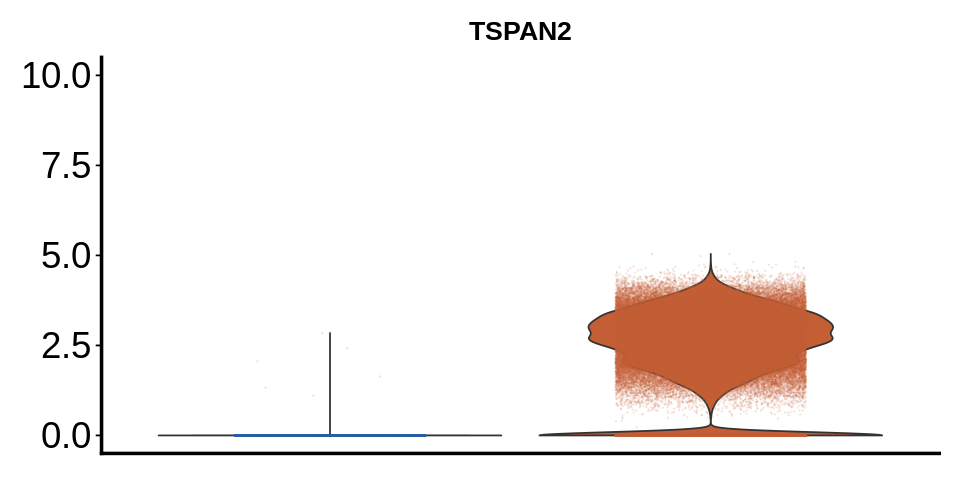

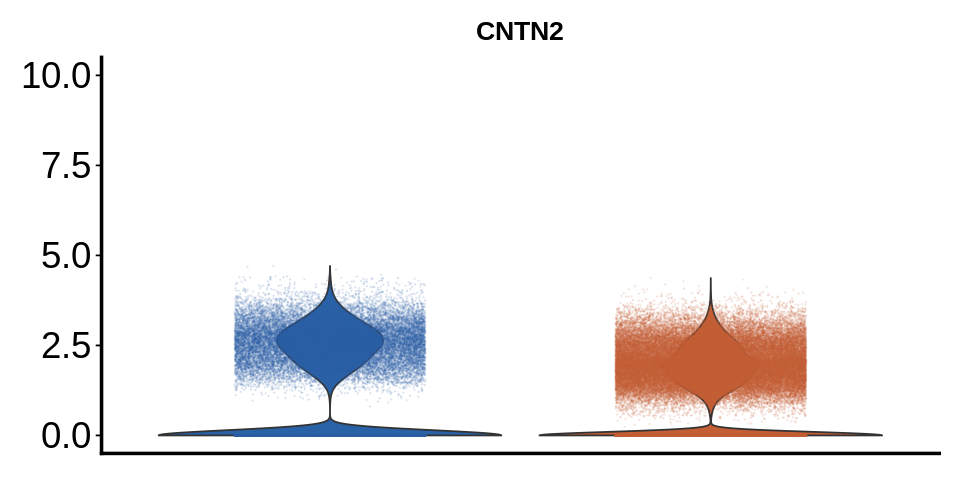

In [205]:
DefaultAssay(HuMo)<-"RNA"
Idents(HuMo) <- "Species"

SpecColor <- c('#2962A7','#C45E34')
SpecColorDots <- c(Human.col, Mouse.col)
#Species specific with y AXIS

p <-  VlnPlot(HuMo, feature ='TSPAN2', split.by = 'Species',pt.size=0.0,y.max=10,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnTSPAN2<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnTSPAN2

p <-  VlnPlot(HuMo, feature ='CNTN2', split.by = 'Species',pt.size=0.0,y.max=10,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnCNTN2<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnCNTN2

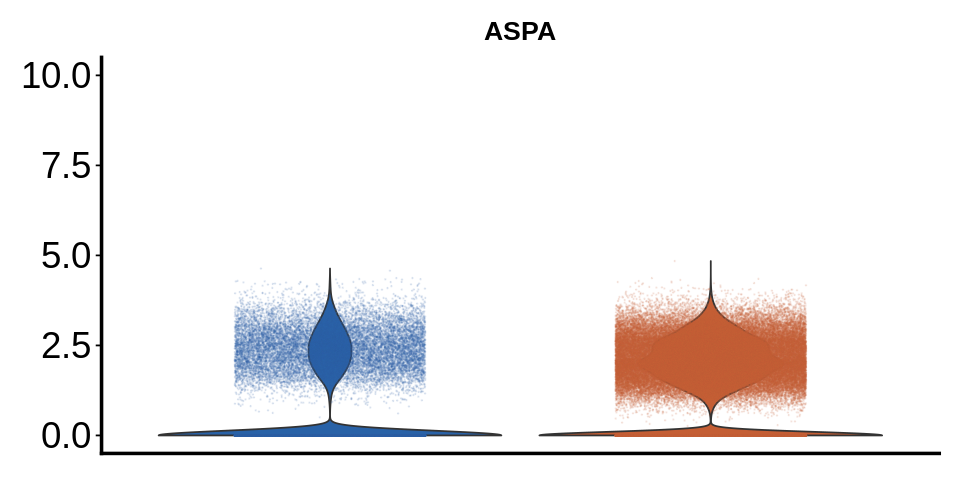

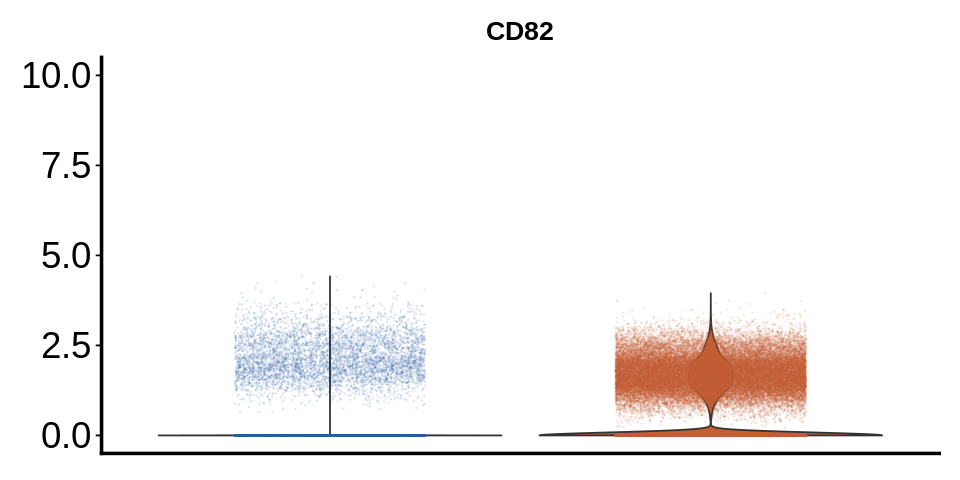

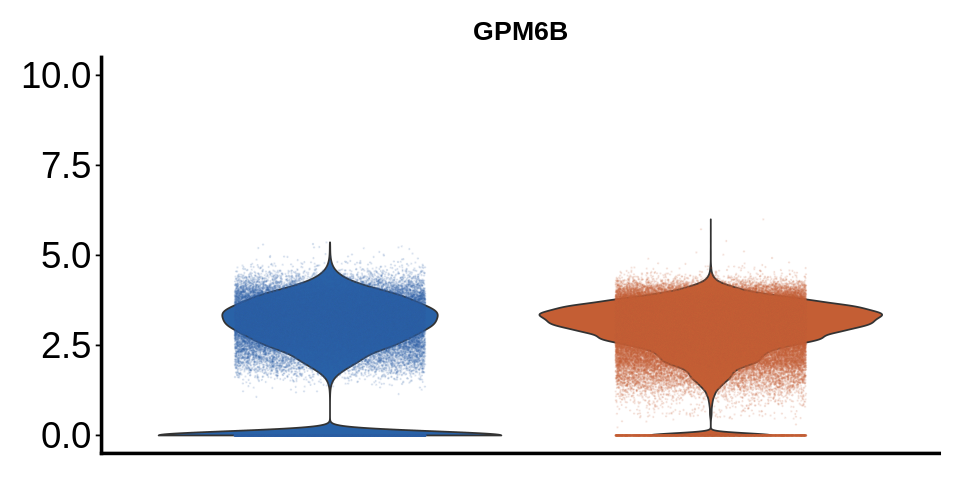

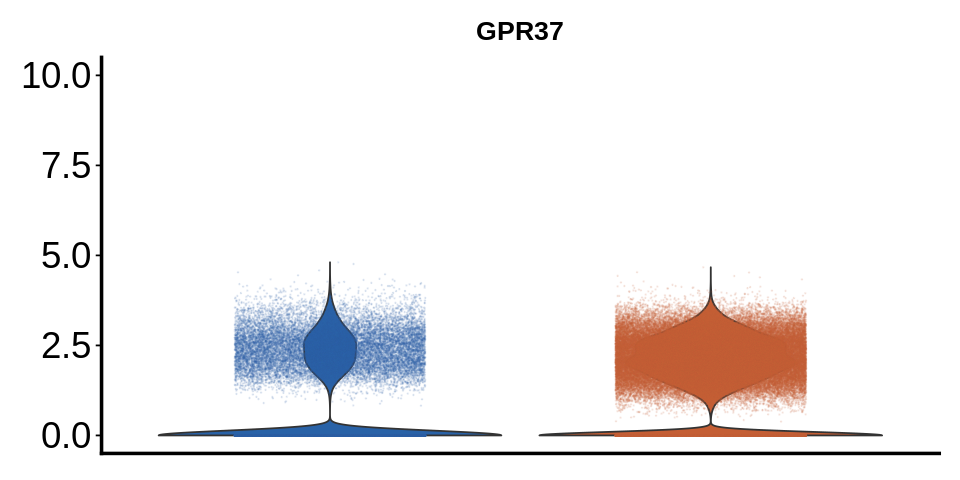

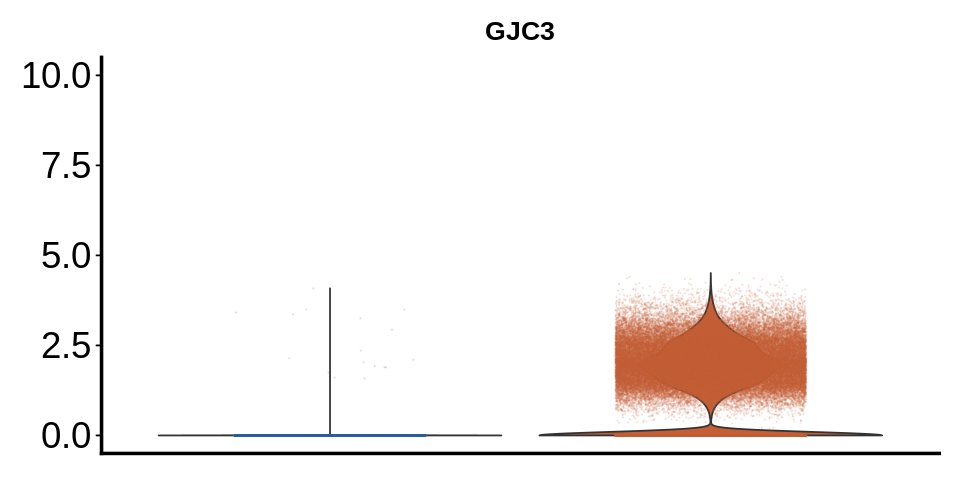

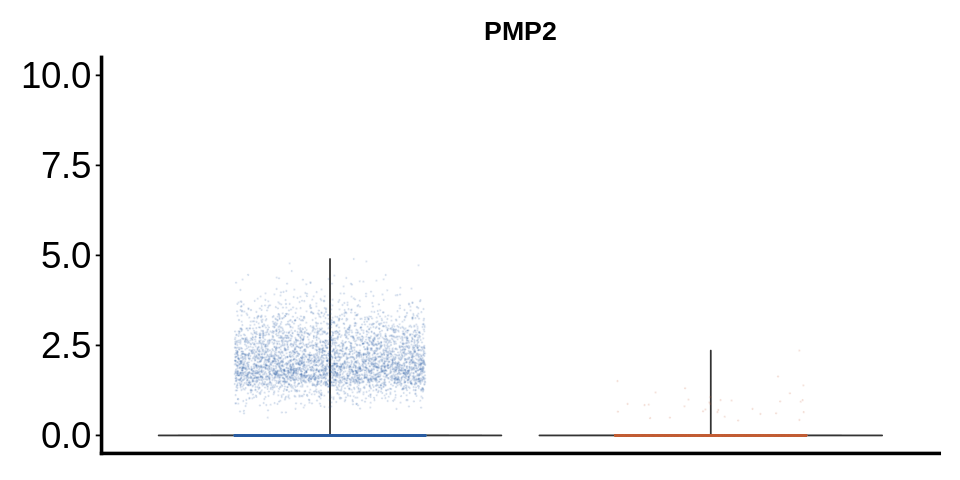

In [215]:
DefaultAssay(HuMo)<-"RNA"
Idents(HuMo) <- "Species"

SpecColor <- c('#2962A7','#C45E34')
SpecColorDots <- c(Human.col, Mouse.col)
#Species specific with y AXIS


p <-  VlnPlot(HuMo, feature ='ASPA', split.by = 'Species',pt.size=0.0,y.max=10,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnASPA<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnASPA

p <-  VlnPlot(HuMo, feature ='CD82', split.by = 'Species',pt.size=0.0,y.max=10,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnCD82<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnCD82

p <-  VlnPlot(HuMo, feature ='GPM6B', split.by = 'Species',pt.size=0.0,y.max=10,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnGPM6B<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnGPM6B

p <-  VlnPlot(HuMo, feature ='GPR37', split.by = 'Species',pt.size=0.0,y.max=10,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnGPR37<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnGPR37

p <-  VlnPlot(HuMo, feature ='GJC3', split.by = 'Species',pt.size=0.0,y.max=10,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnGJC3<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnGJC3

p <-  VlnPlot(HuMo, feature ='PMP2', split.by = 'Species',pt.size=0.0,y.max=10,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnPMP2<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnPMP2

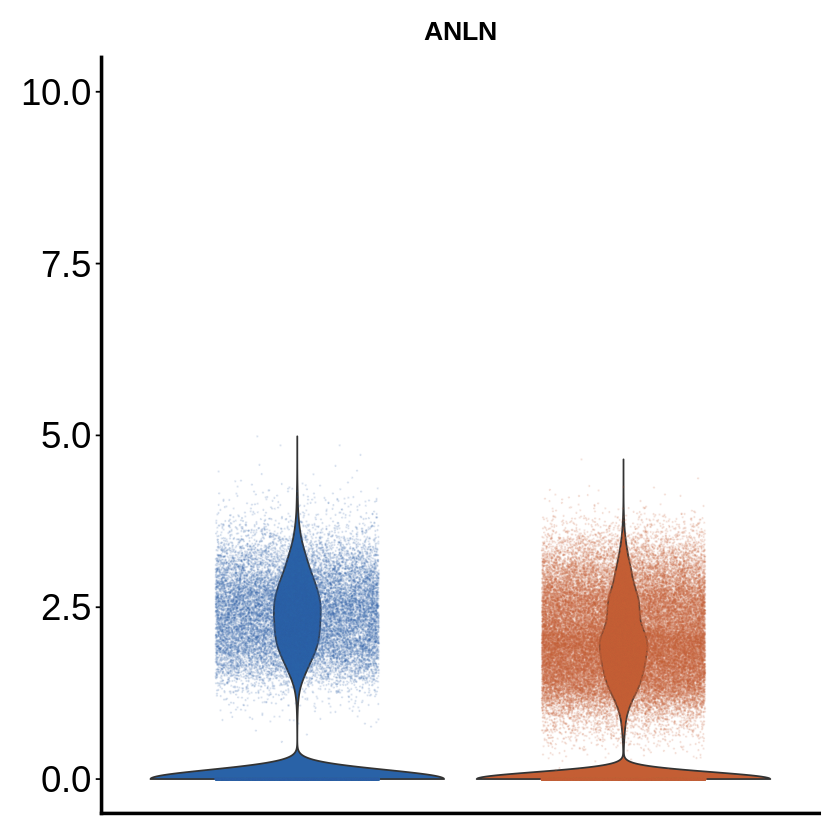

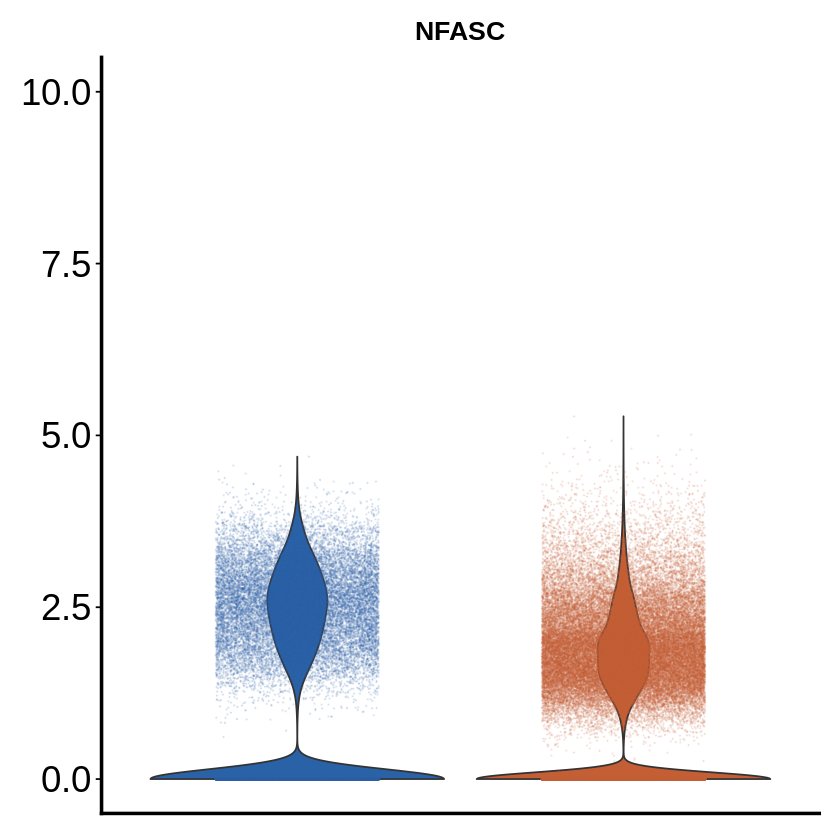

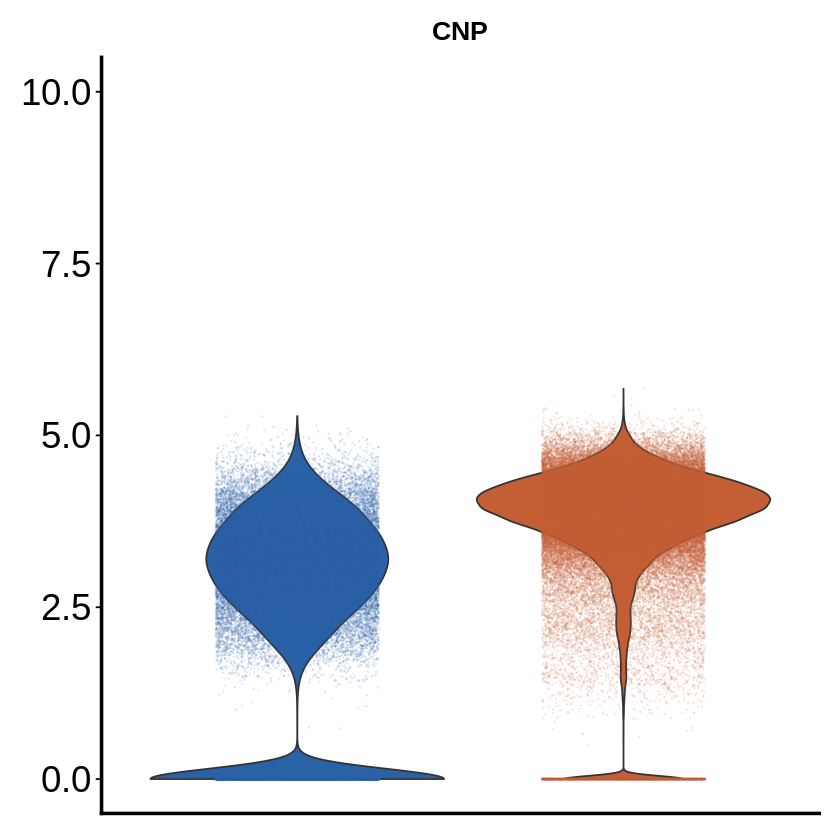

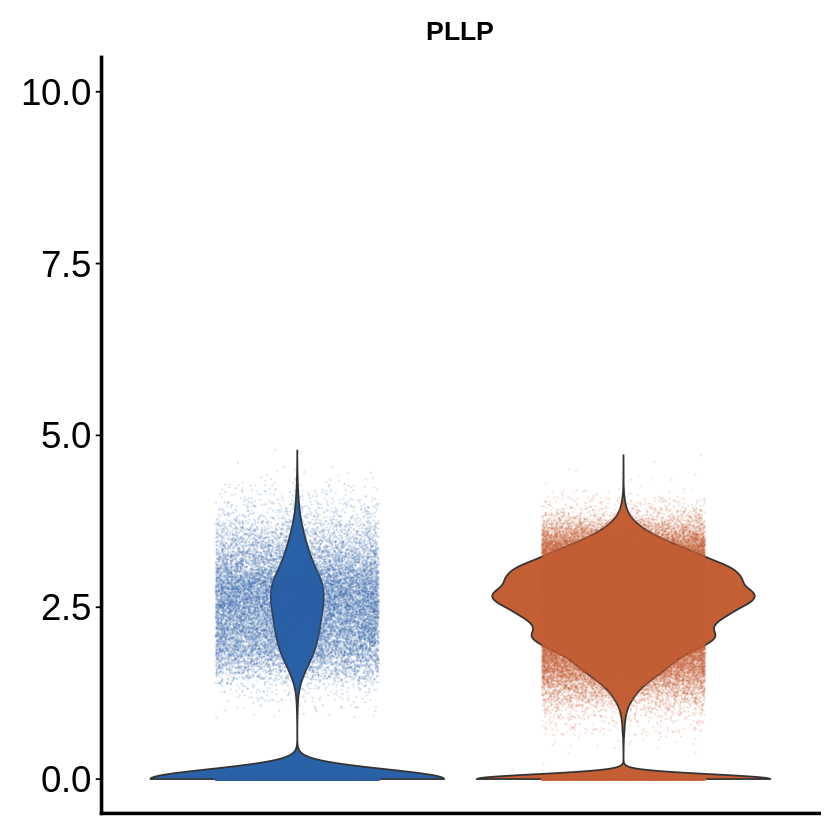

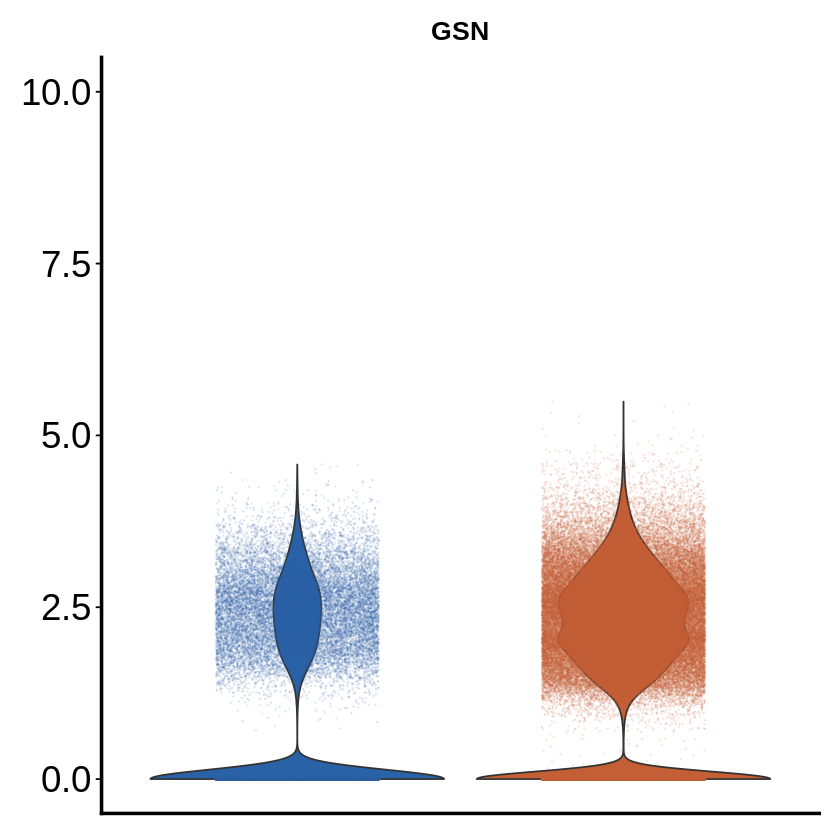

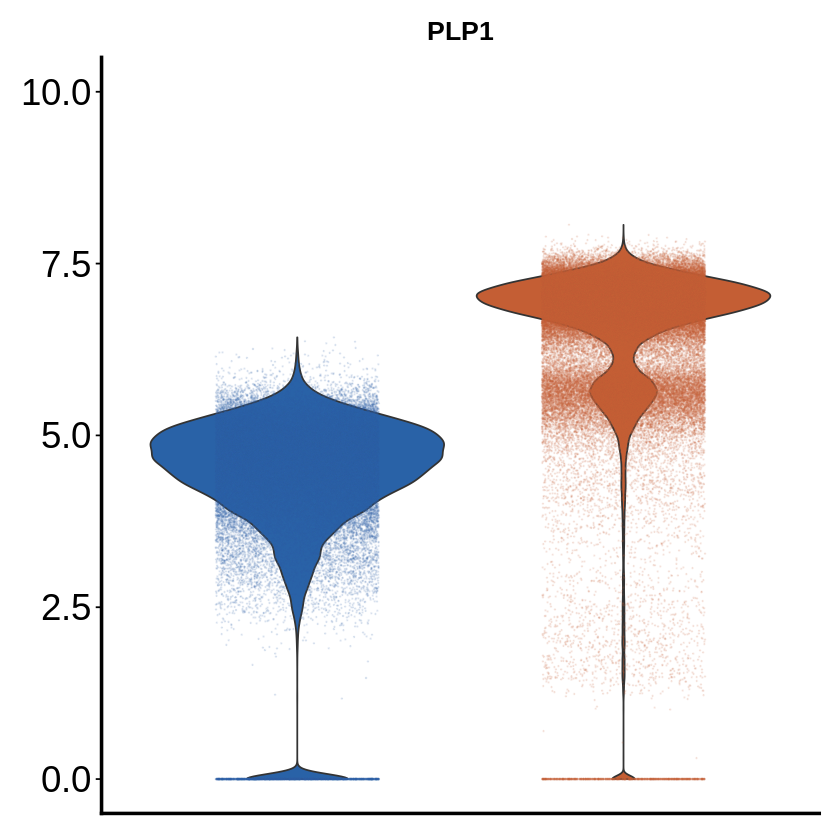

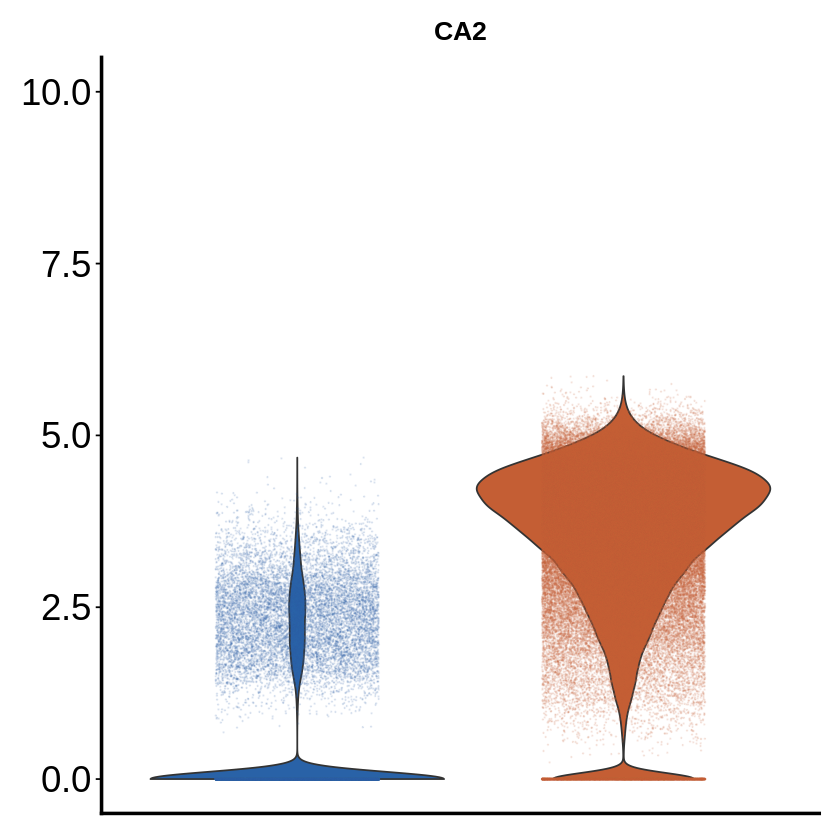

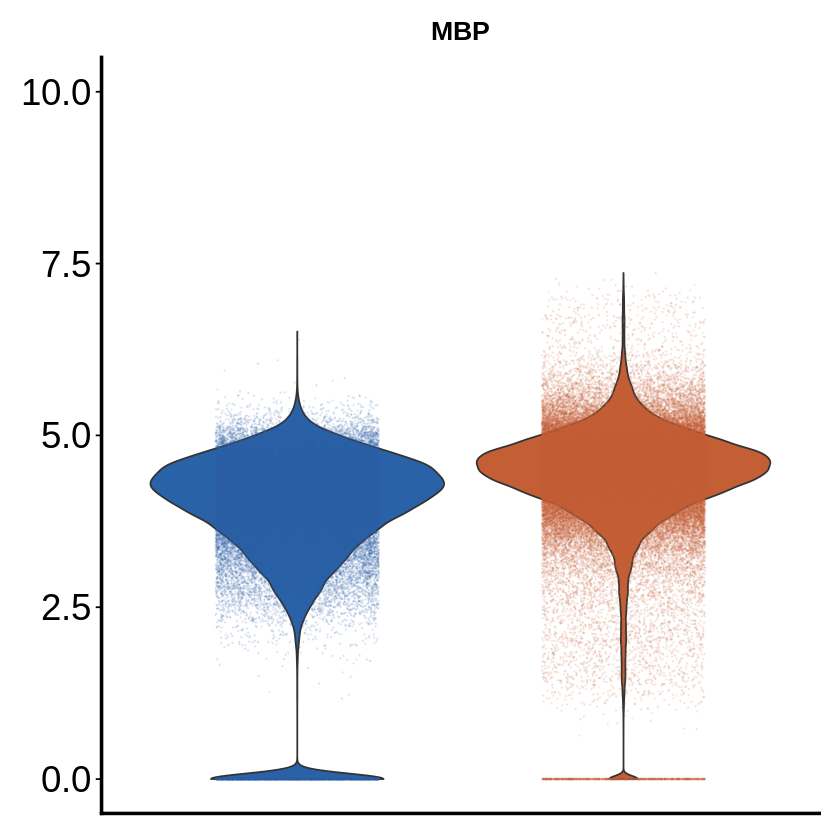

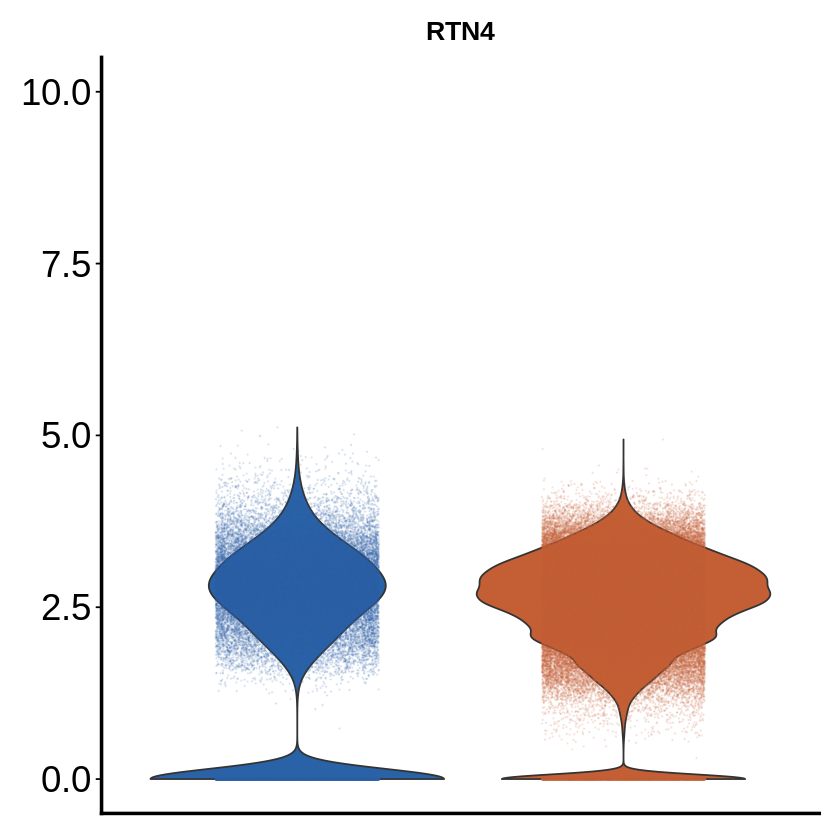

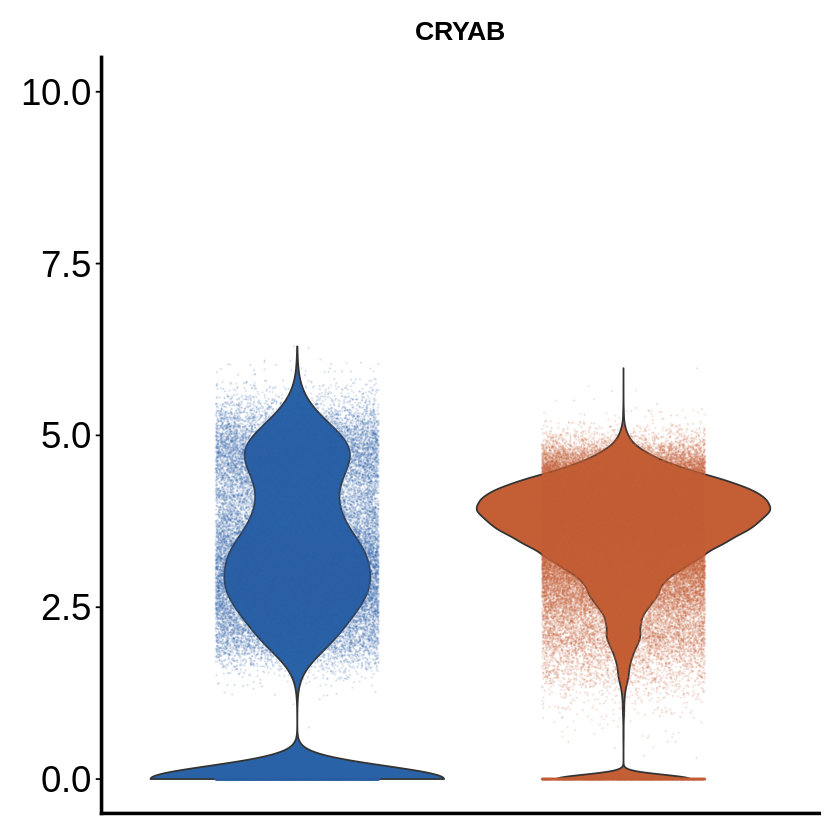

In [16]:
DefaultAssay(HuMo)<-"RNA"
Idents(HuMo) <- "Species"

SpecColor <- c('#2962A7','#C45E34')
SpecColorDots <- c(Human.col, Mouse.col)
#Species specific with y AXIS


p <-  VlnPlot(HuMo, feature ='ANLN', split.by = 'Species',pt.size=0.0,y.max=10,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnANLN<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnANLN

p <-  VlnPlot(HuMo, feature ='NFASC', split.by = 'Species',pt.size=0.0,y.max=10,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnNFASC<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnNFASC

p <-  VlnPlot(HuMo, feature ='CNP', split.by = 'Species',pt.size=0.0,y.max=10,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnCNP<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnCNP

p <-  VlnPlot(HuMo, feature ='PLLP', split.by = 'Species',pt.size=0.0,y.max=10,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnPLLP<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnPLLP

p <-  VlnPlot(HuMo, feature ='GSN', split.by = 'Species',pt.size=0.0,y.max=10,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnGSN<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnGSN

p <-  VlnPlot(HuMo, feature ='PLP1', split.by = 'Species',pt.size=0.0,y.max=10,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnPLP1<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnPLP1

p <-  VlnPlot(HuMo, feature ='CA2', split.by = 'Species',pt.size=0.0,y.max=10,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnCA2<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnCA2


p <-  VlnPlot(HuMo, feature ='MBP', split.by = 'Species',pt.size=0.0,y.max=10,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnMBP<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnMBP


p <-  VlnPlot(HuMo, feature ='RTN4', split.by = 'Species',pt.size=0.0,y.max=10,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnRTN4<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnRTN4

p <-  VlnPlot(HuMo, feature ='CRYAB', split.by = 'Species',pt.size=0.0,y.max=10,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnCRYAB<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnCRYAB



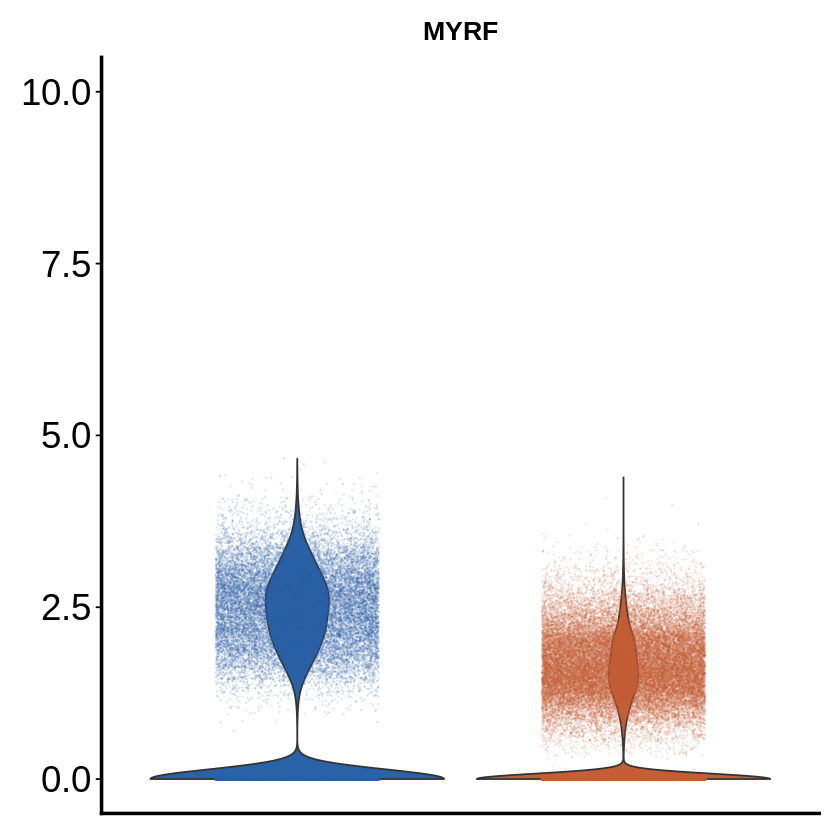

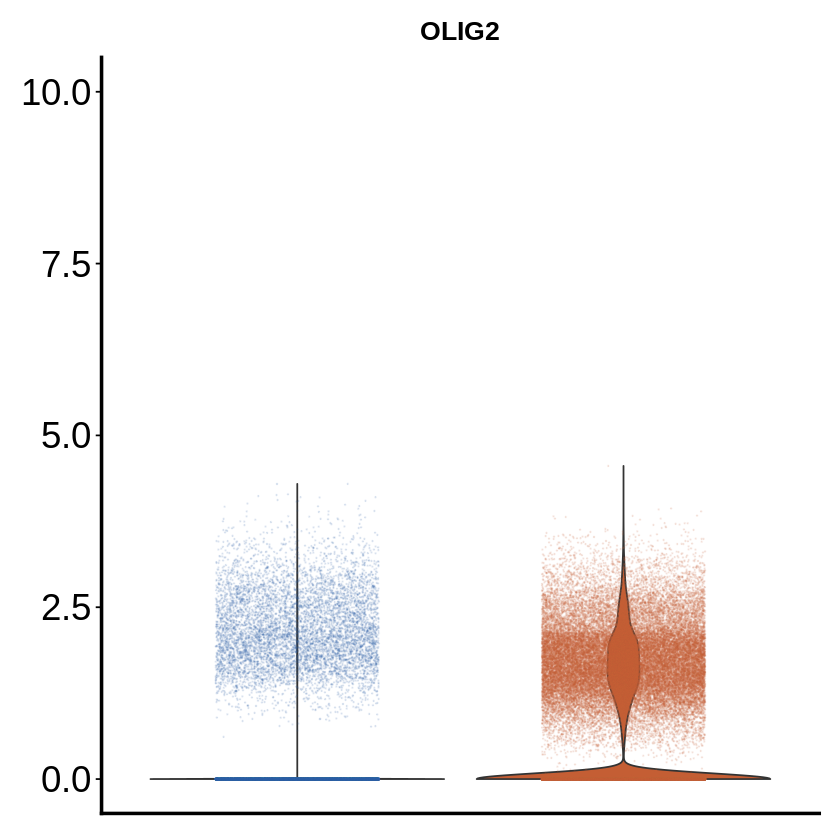

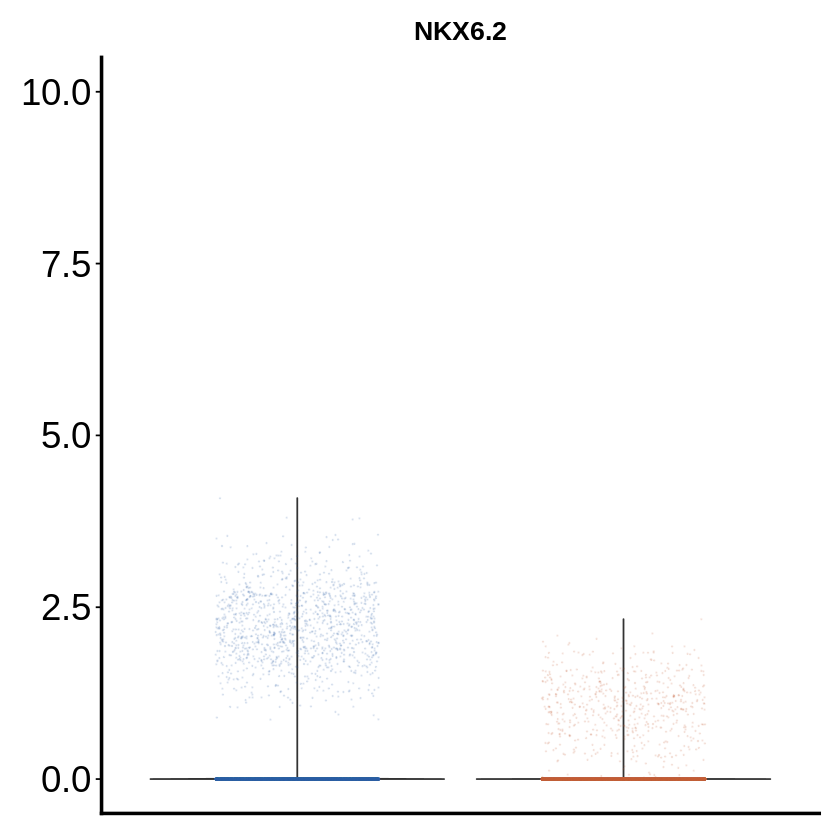

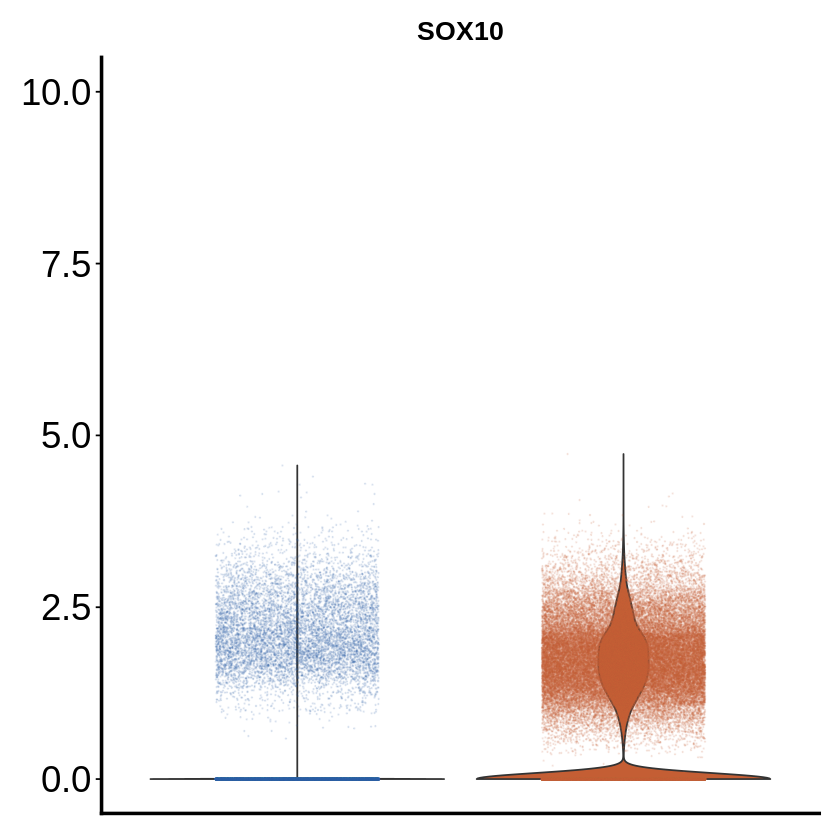

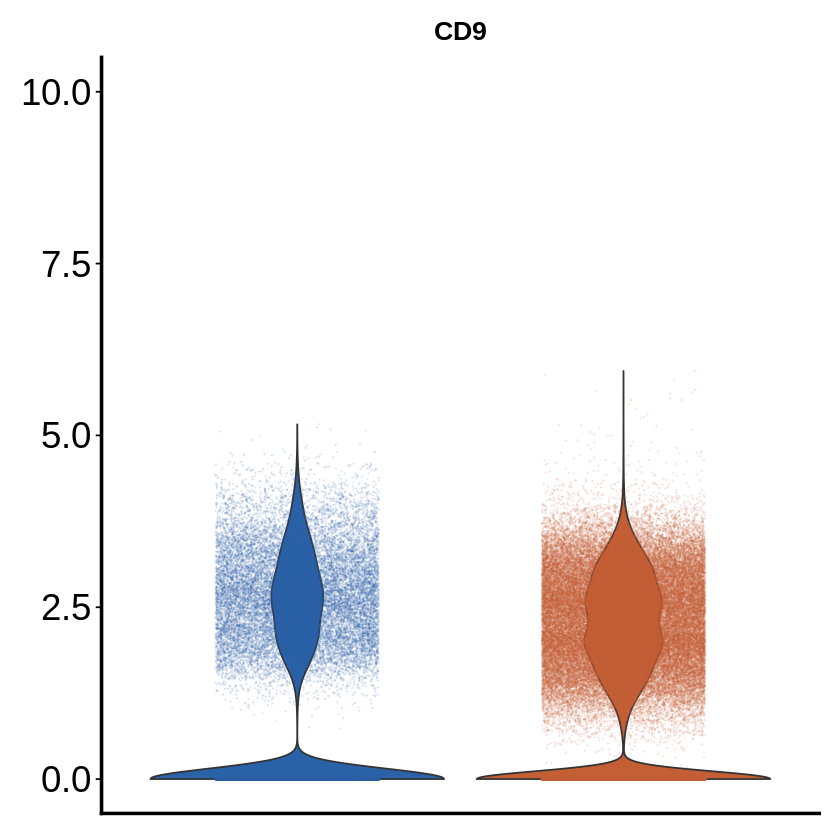

In [10]:

p <-  VlnPlot(HuMo, feature ='MYRF', split.by = 'Species',pt.size=0.0,y.max=10,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnMYRF<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnMYRF


p <-  VlnPlot(HuMo, feature ='OLIG2', split.by = 'Species',pt.size=0.0,y.max=10,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnOLIG2<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnOLIG2


p <-  VlnPlot(HuMo, feature ='NKX6.2', split.by = 'Species',pt.size=0.0,y.max=10,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnNKX6.2<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnNKX6.2


p <-  VlnPlot(HuMo, feature ='SOX10', split.by = 'Species',pt.size=0.0,y.max=10,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnSOX10<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnSOX10


p <-  VlnPlot(HuMo, feature ='CD9', split.by = 'Species',pt.size=0.0,y.max=10,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnCD9<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnCD9

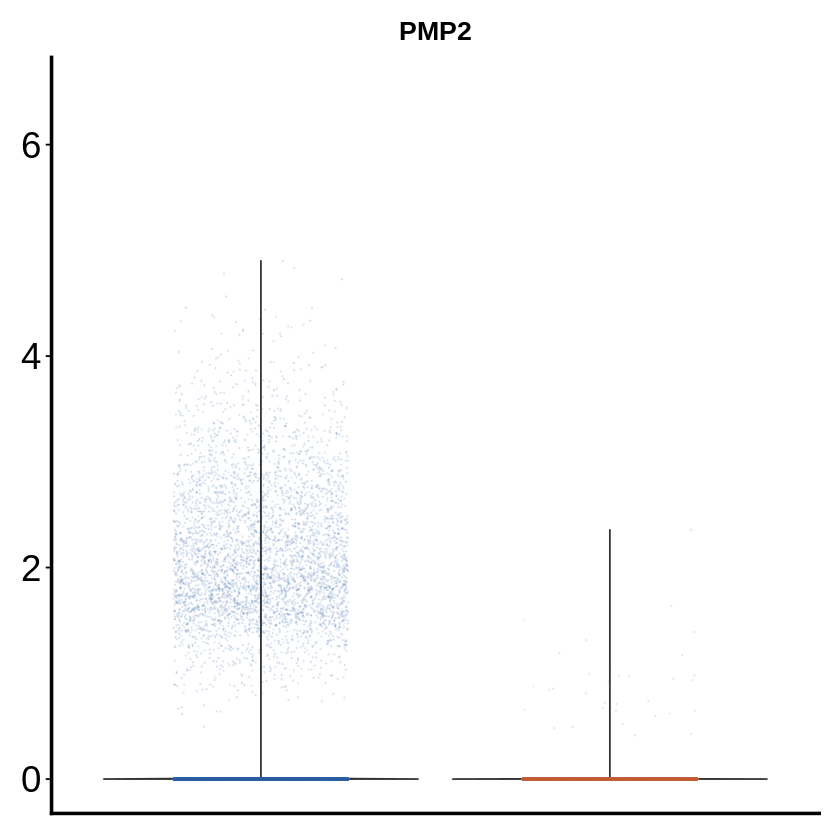

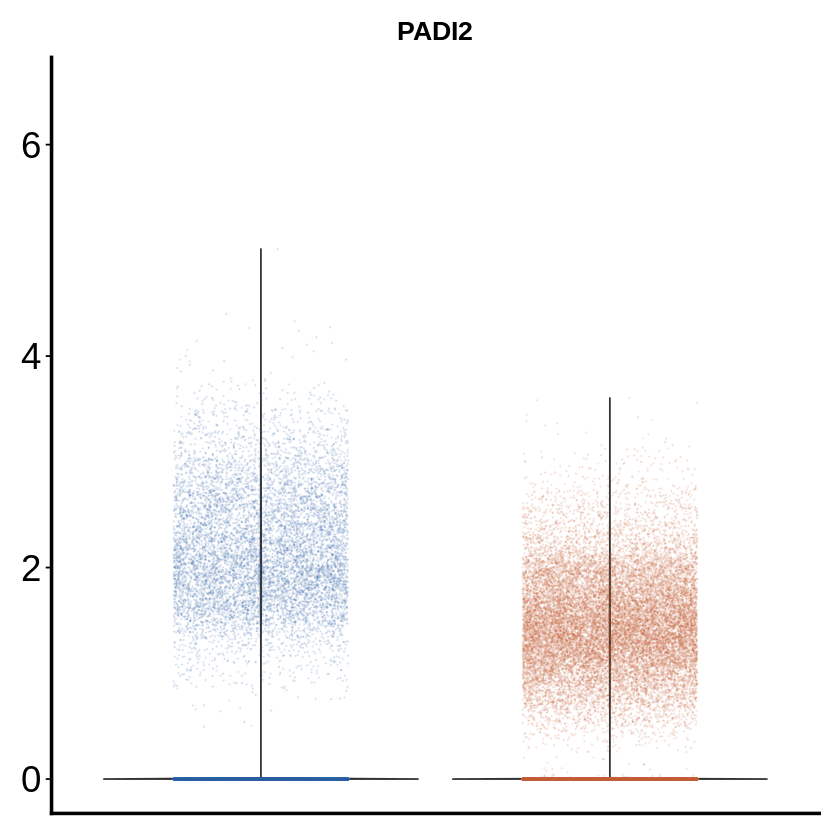

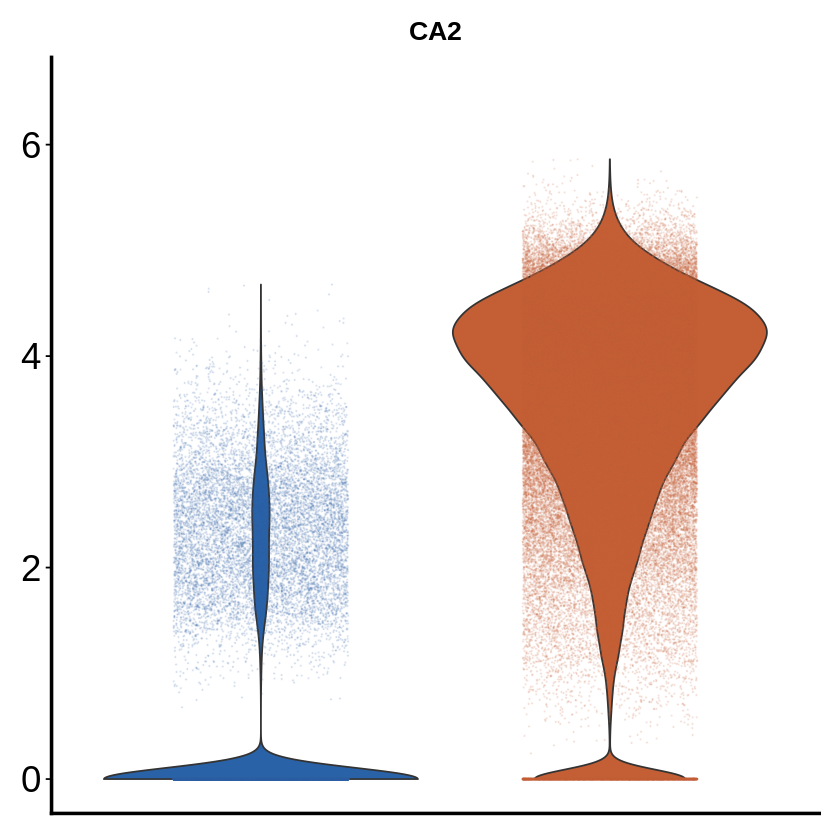

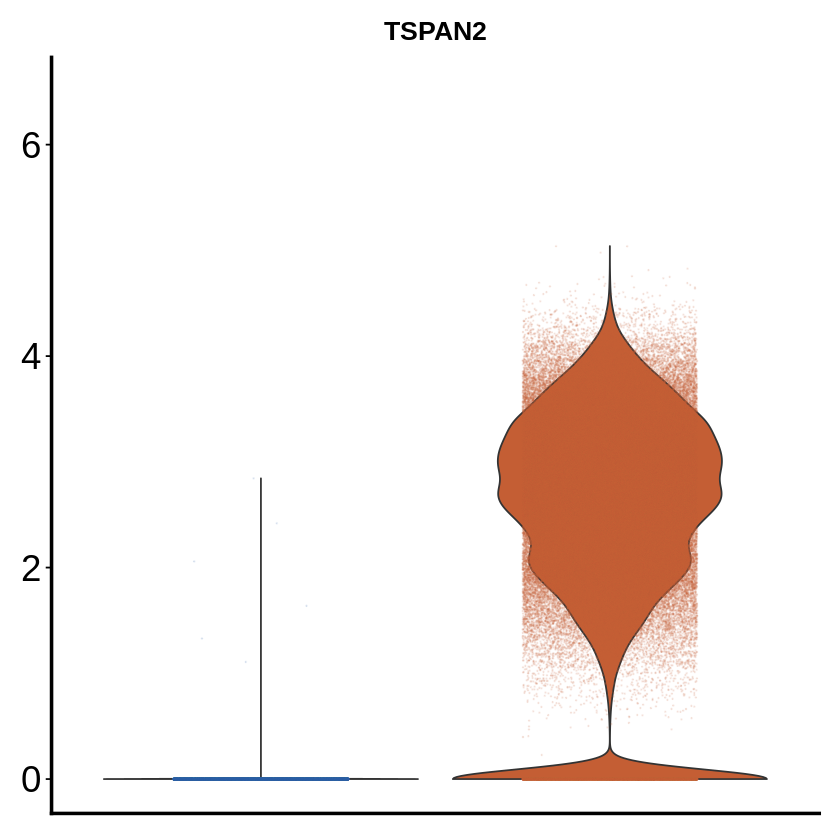

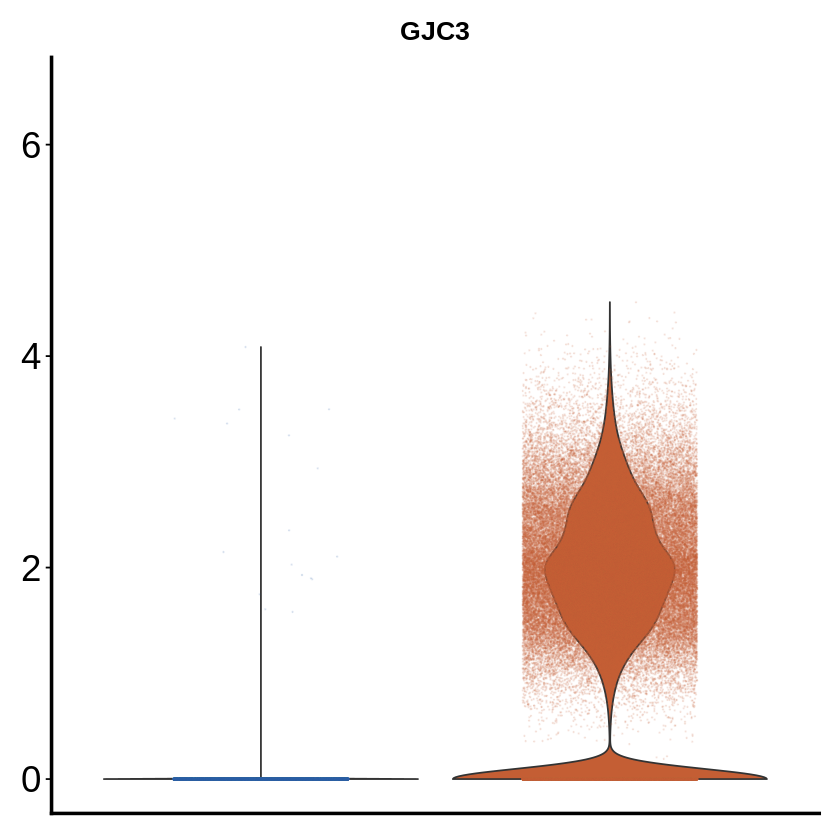

In [15]:
DefaultAssay(HuMo)<-"RNA"
Idents(HuMo) <- "Species"

SpecColor <- c('#2962A7','#C45E34')
SpecColorDots <- c(Human.col, Mouse.col)
#Species specific with y AXIS

p <-  VlnPlot(HuMo, feature ='PMP2', split.by = 'Species',pt.size=0.0,y.max=6.5,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnPMP2<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnPMP2


p <-  VlnPlot(HuMo, feature ='PADI2', split.by = 'Species',pt.size=0.0,y.max=6.5,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnPADI2<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnPADI2


p <-  VlnPlot(HuMo, feature ='CA2', split.by = 'Species',pt.size=0.0,y.max=6.5,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnCA2<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnCA2


p <-  VlnPlot(HuMo, feature ='TSPAN2', split.by = 'Species',pt.size=0.0,y.max=6.5,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnTSPAN2<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnTSPAN2


p <-  VlnPlot(HuMo, feature ='GJC3', split.by = 'Species',pt.size=0.0,y.max=6.5,cols=SpecColor)#+scale_y_continuous(limits = c(-2,10))
VlnGJC3<-p+ geom_jitter(mapping = aes(color = split), data = p$data, position = position_jitterdodge(jitter.width = 1, dodge.width = 0.00), size=0.1)+
    scale_color_manual(breaks = c('Human','Mouse'), values = SpecColorDots) +
    theme(legend.position='none', axis.text.x = element_blank(), axis.ticks.x = element_blank(),
          axis.title.x= element_blank(), axis.title.y= element_blank(),
           axis.text.y = element_text(size=22), axis.line = element_line(size = 1)
           )
VlnGJC3

In [ ]:
 #Violin plots splitted by species revealing expression levels of marker genes 


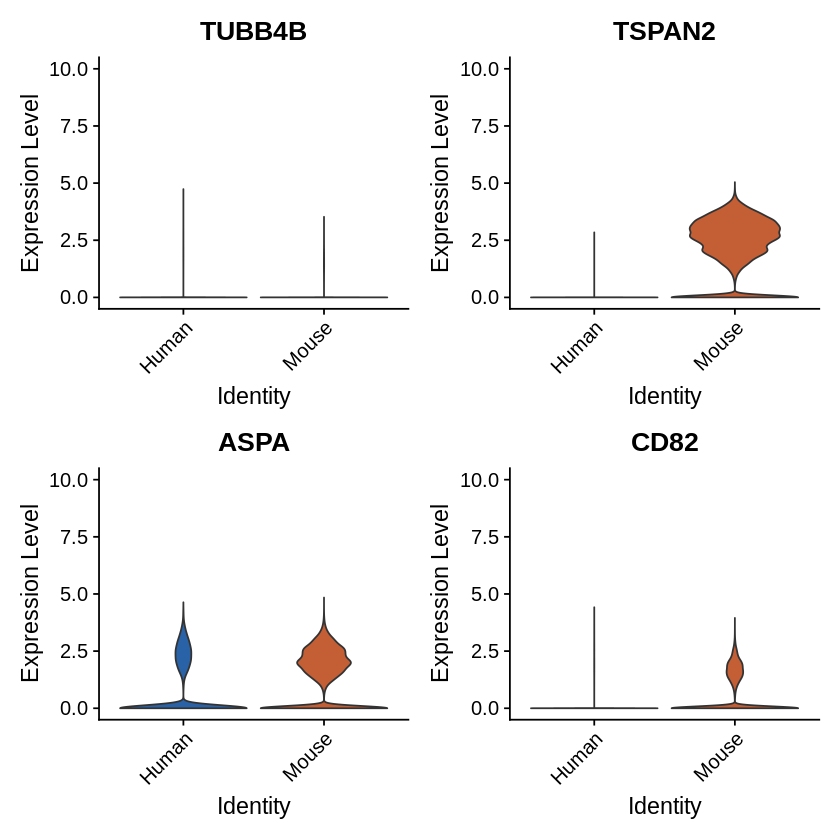

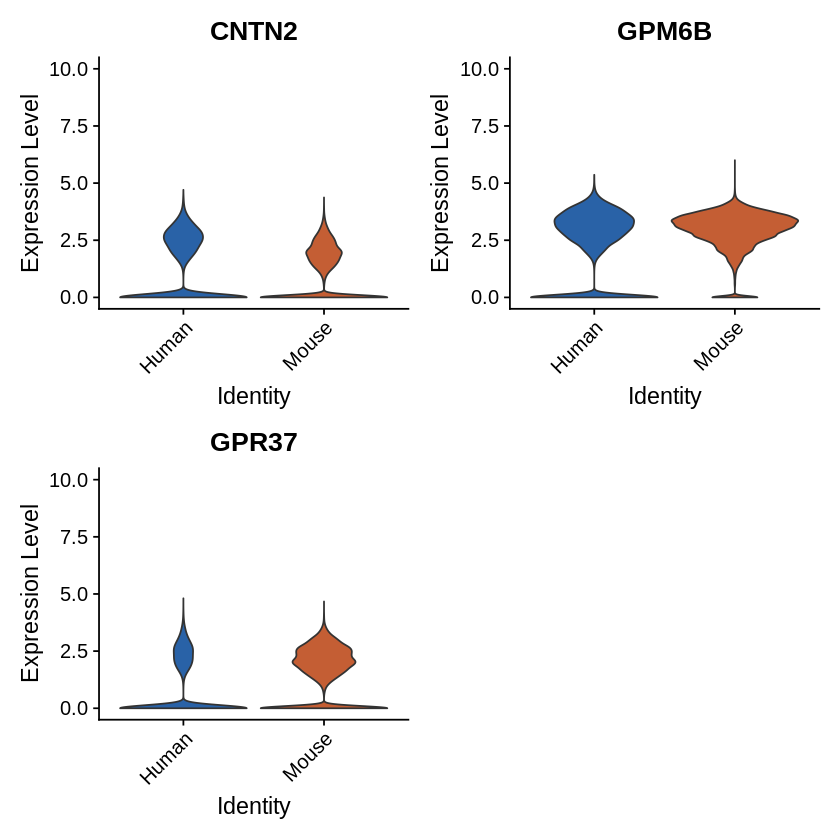

Warning message:
“Removed 440 rows containing non-finite values (stat_ydensity).”

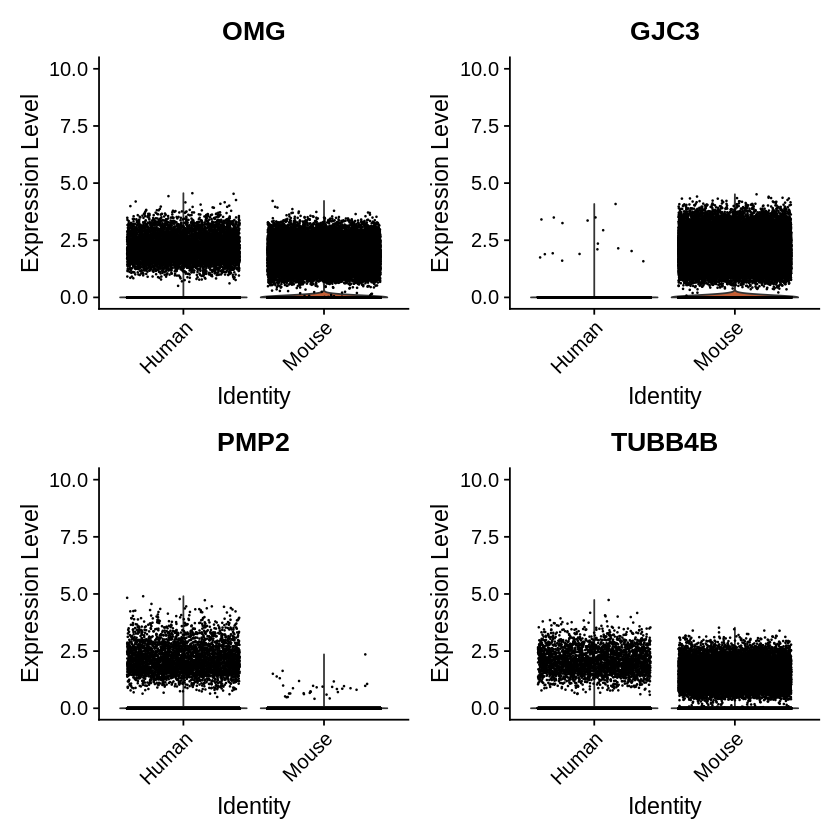

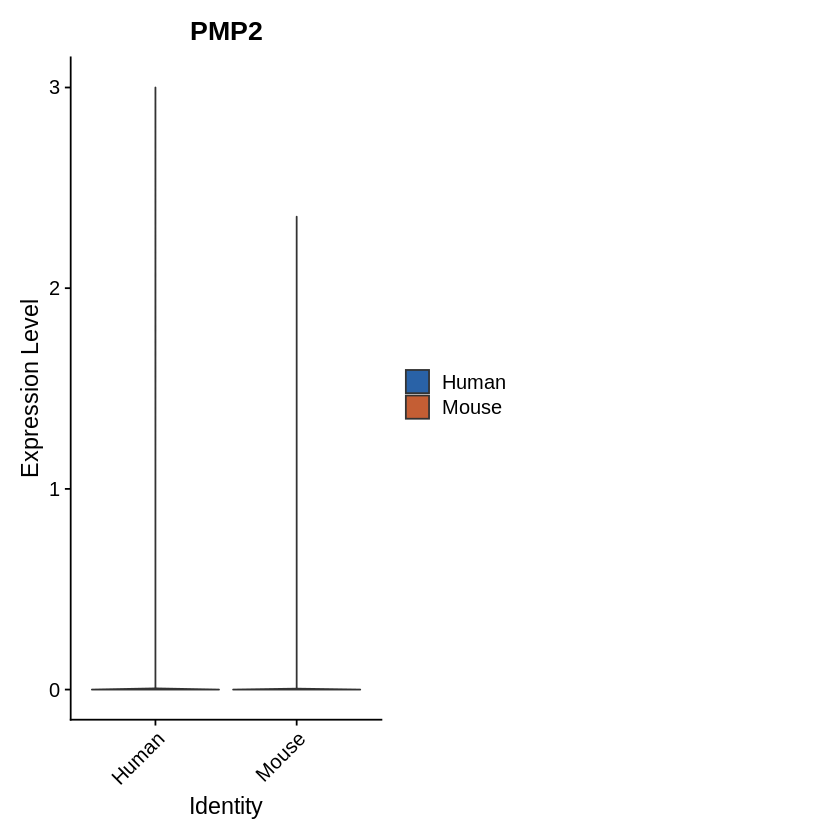

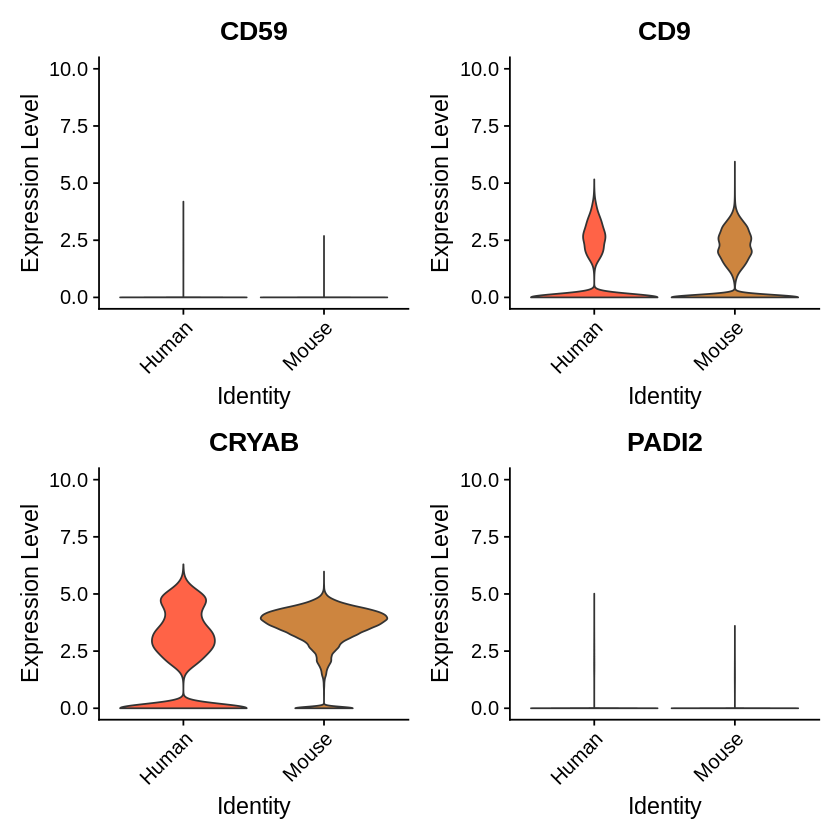

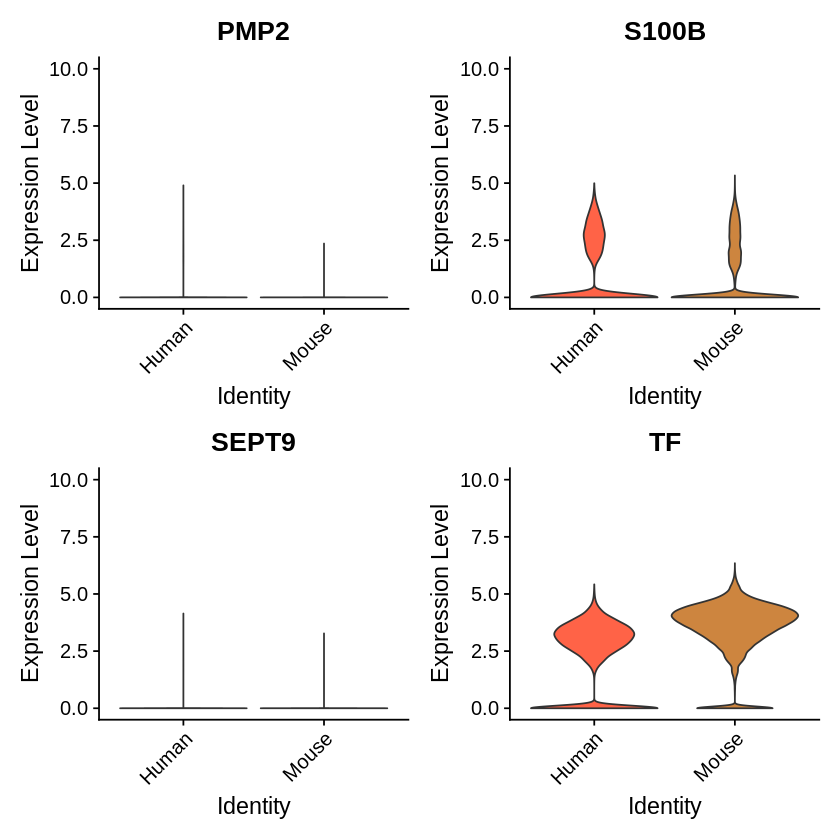

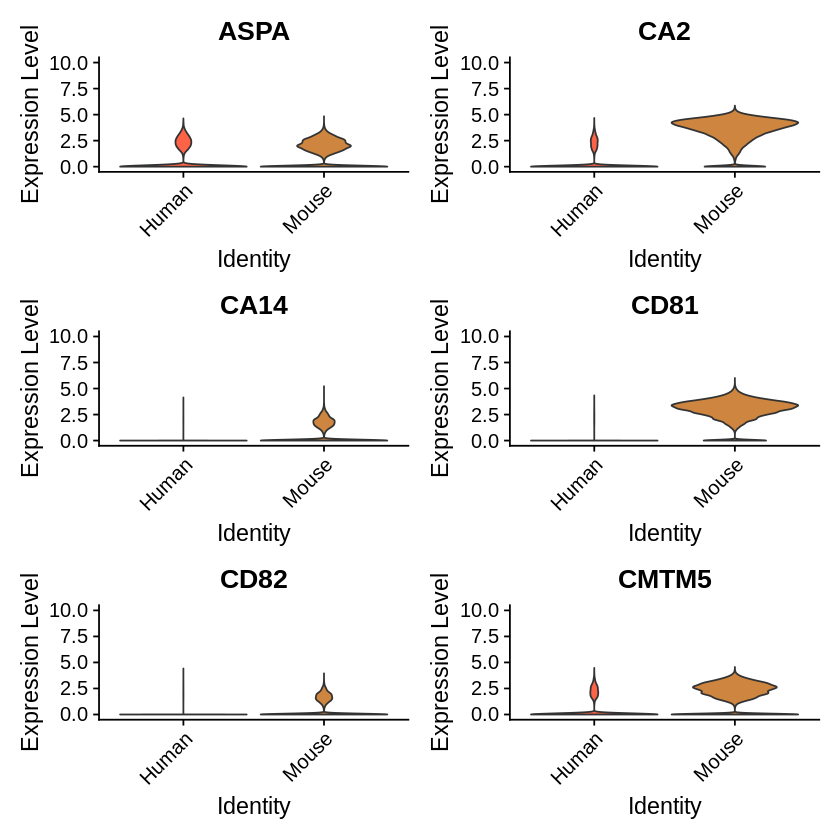

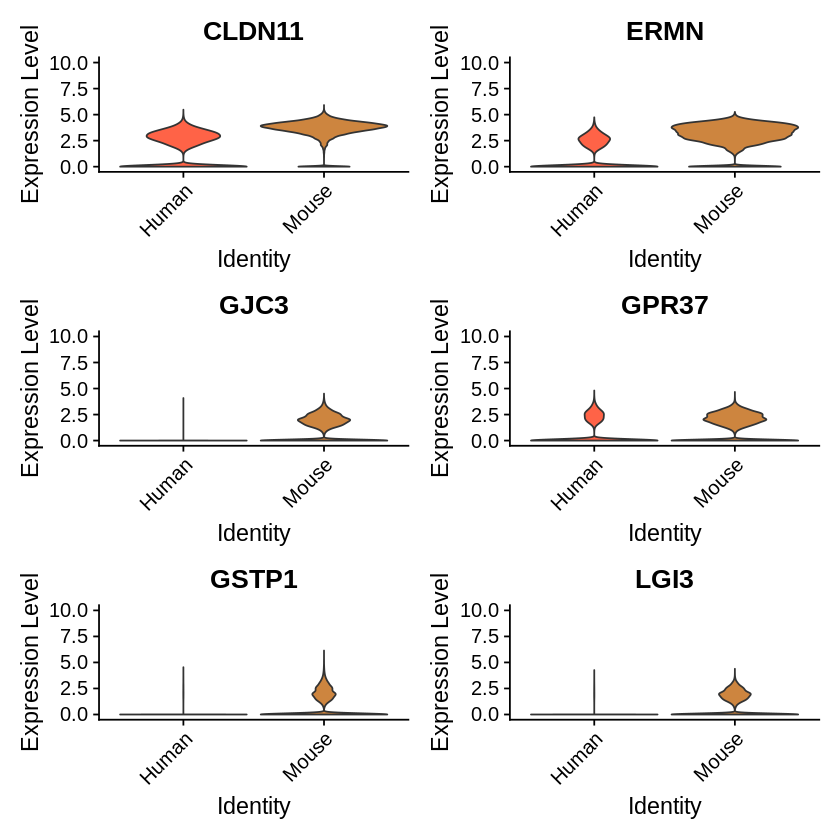

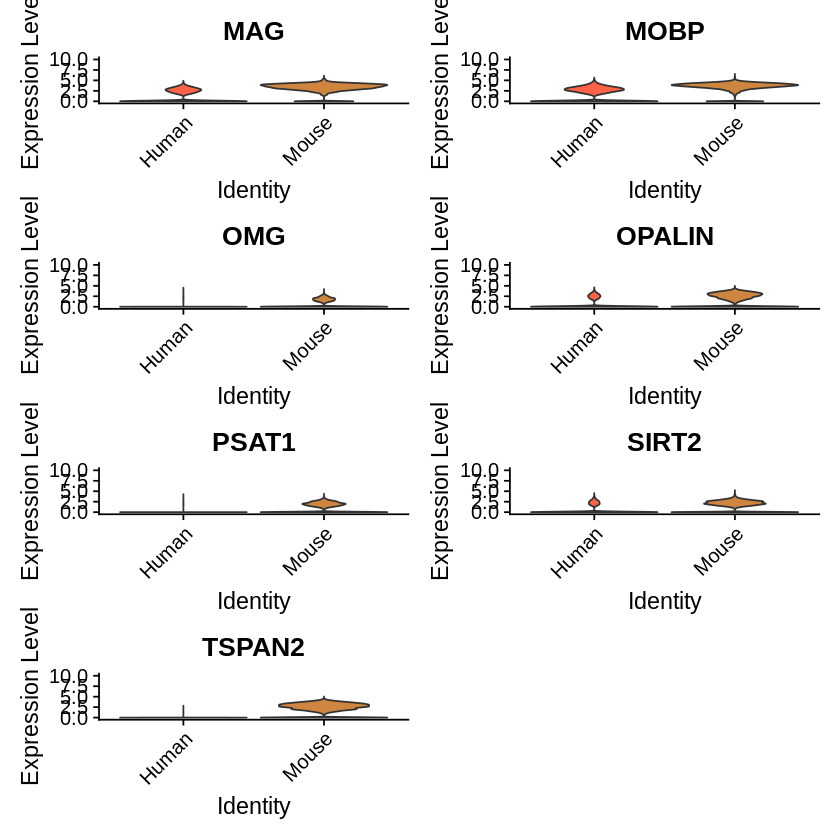

In [12]:
DefaultAssay(HuMo)<-"RNA"
Idents(HuMo) <- "Species"
SpecColor <- c('#2962A7','#C45E34')
#Species specific
Vln_Species1_0.1<-VlnPlot(HuMo,c("TUBB4B", "TSPAN2",'ASPA','CD82' ),ncol=2, pt.size=0,y.max=10, cols=SpecColor)
Vln_Species2_0.1<-VlnPlot(HuMo,c('CNTN2','GPM6B', "GPR37"),ncol=2, pt.size=0,y.max=10, cols=SpecColor)
Vln_Species3_0.1<-VlnPlot(HuMo,c('OMG','GJC3',"PMP2",'TUBB4B'),ncol=2, pt.size=0.1,y.max=10, cols=SpecColor)


Vln_Species4_0.1<-VlnPlot(HuMo,c( "PMP2"),ncol=2, pt.size=0,y.max=3, cols=SpecColor)

#Human
Vln_Human1_0.1<-VlnPlot(HuMo,c("CD59", "CD9", "CRYAB", "PADI2"),ncol=2,y.max=10, pt.size=0, cols=color)
Vln_Human2_0.1<-VlnPlot(HuMo,c("PMP2", "S100B", "SEPT9", "TF" ),ncol=2,y.max=10, pt.size=0, cols=color)

#Mouse
Vln_Mouse1_0.1<-VlnPlot(HuMo,c("ASPA", "CA2", "CA14", "CD81", "CD82", "CMTM5" ),ncol=2, y.max=10,pt.size=0, cols=color)
Vln_Mouse2_0.1<-VlnPlot(HuMo,c("CLDN11", "ERMN","GJC3", "GPR37", "GSTP1", "LGI3"),ncol=2,y.max=10, pt.size=0, cols=color)
Vln_Mouse3_0.1<-VlnPlot(HuMo,c("MAG", "MOBP", "OMG", "OPALIN", "PSAT1", "SIRT2", "TSPAN2" ),ncol=2, y.max=10,pt.size=0, cols=color)


#print
Vln_Species1_0.1
Vln_Species2_0.1
Vln_Species3_0.1
Vln_Species4_0.1

Vln_Human1_0.1
Vln_Human2_0.1
Vln_Mouse1_0.1
Vln_Mouse2_0.1
Vln_Mouse3_0.1